In [41]:
import pandas as pd
import numpy as np

# utility
from sklearn.base import clone
from sklearn.pipeline import make_pipeline, Pipeline
from sklearn.utils.class_weight import compute_class_weight

#viz
import seaborn as sns
import matplotlib.pyplot as plt
# from mlxtend.plotting import plot_sequential_feature_selection as plot_sfs

# parallel
import ray

try:
    ray.shutdown()
except:
    print("ray not started")

ray.init()

from sklearn.preprocessing import StandardScaler, Normalizer, MinMaxScaler, RobustScaler, MaxAbsScaler
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV, StratifiedShuffleSplit, LeaveOneOut, KFold
from scipy.stats import loguniform
from imblearn.under_sampling import RandomUnderSampler
# from mlxtend.feature_selection import SequentialFeatureSelector, ExhaustiveFeatureSelector
from imblearn.pipeline import Pipeline as ImbPipeline
from sklearn.model_selection import train_test_split
from sklearn.feature_selection import VarianceThreshold
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.feature_selection import SelectKBest, f_classif, SelectFromModel
from sklearn.decomposition import PCA, NMF
# from mlxtend.feature_selection import SequentialFeatureSelector
# from tensorflow.keras.callbacks import EarlyStopping

# models
from sklearn.svm import SVC, LinearSVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.linear_model import LogisticRegression, ElasticNet, RidgeClassifier, LinearRegression
from xgboost import XGBClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import AdaBoostClassifier
from lightgbm import LGBMClassifier
from lineartree import LinearTreeClassifier, LinearForestClassifier


# analysis
from sklearn.metrics import confusion_matrix, precision_score, recall_score, accuracy_score, f1_score

pd.set_option('display.max_colwidth', None)
pd.set_option("display.max_columns", None) # show all cols

# from data_cleaning import clean_raw_data, create_dataset, get_all_results

from data_cleaning import clean_raw_data, create_dataset
from sklearn.ensemble import ExtraTreesClassifier
from mango import Tuner

RESULTS_DIR = "results/"
DATA_DIR = "data/"
SEED = 42

# reload modules in py files
%load_ext autoreload
%autoreload 2

2023-04-10 19:55:29,915	INFO worker.py:1553 -- Started a local Ray instance.


The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


## TODO 4
Very low on the list of priorities but I had some dependency issues as I was just installing things via pip which doesn't check package dependencies. requirements.txt should work if you install all the packages using that, but could be of interest eventually to use something like poem or pipenv that to actually sort out dependencies the right way. But for now thats research...

### install any packages here 

In [35]:
!pip install linear-tree

  Using cached linear_tree-0.3.5-py3-none-any.whl (21 kB)


In [78]:
!pip uninstall --yes mlxtend

Found existing installation: mlxtend 0.22.0
Uninstalling mlxtend-0.22.0:
  Successfully uninstalled mlxtend-0.22.0


## clean dataset using functions in src/data_cleaning.py

In [42]:


X, y = create_dataset(clean_raw_data(f"../{DATA_DIR}Brdi_db_march.xlsx"), target_col="NHL")
print("No missing values in X: ", (X.isna().sum() == 0).all())
print("No missing values in y: ", (y.isna().sum() == 0).all())
print(X.columns)
display(X.head(5),X.shape ,y.head(5), y.shape)

print(y.value_counts())

/home/mmoschit/Concussions-and-Athletic-Performance/src
No missing values in X:  True
No missing values in y:  True
Index(['age', 'concussions', 'weight', 'bimanualscore_washer', 'RT_V', 'RT_HR',
       'Delta_RT', 'MT_V', 'MT_HR', 'Delta_MT', 'TMT_V', 'TMT_HR', 'CMT_V',
       'CMT_HR', 'cvRT_V', 'cvRT_HR', 'stdRT_V', 'stdRT_HR', 'BallPath_V',
       'BallPath_HR', 'FullPath_V', 'FullPath_HR', 'Delta_Fullpath',
       'Corrective_V', 'Corrective_HR', 'PeakV_V', 'PeakV_HR', 'Delta_PV',
       'AE_V', 'AE_HR', 'Delta_AE', 'VE_V', 'VE_HR', 'AbsOnAxis_HR',
       'Delta_OnAxis', 'AbsOffAxis_V', 'AbsOffAxis_HR', 'Delta_OffAxis',
       'AbsOnAxis_V'],
      dtype='object')


,age,concussions,weight,bimanualscore_washer,RT_V,RT_HR,Delta_RT,MT_V,MT_HR,Delta_MT,TMT_V,TMT_HR,CMT_V,CMT_HR,cvRT_V,cvRT_HR,stdRT_V,stdRT_HR,BallPath_V,BallPath_HR,FullPath_V,FullPath_HR,Delta_Fullpath,Corrective_V,Corrective_HR,PeakV_V,PeakV_HR,Delta_PV,AE_V,AE_HR,Delta_AE,VE_V,VE_HR,AbsOnAxis_HR,Delta_OnAxis,AbsOffAxis_V,AbsOffAxis_HR,Delta_OffAxis,AbsOnAxis_V
0,18,1.0,193,20.54,426.570000,680.8300,254.26,241.7300,895.6200,653.90,285.4000,1200.6900,43.67,305.07,0.10,0.21,42.79,140.47,64.82,66.62,70.00,77.51,7.50,5.18,10.89,211.89,64.68,-147.21,9.71,15.44,5.73,5.02,8.77,10.940000,2.92,3.790000,7.560000,3.77,8.010000
2,18,1.0,196,20.20,398.272727,541.1175,142.84,259.1539,222.6922,-36.46,265.3636,249.5000,6.21,26.81,0.09,0.28,34.58,151.09,69.48,62.36,69.73,73.17,3.44,0.25,10.81,195.69,238.35,42.66,5.22,6.07,0.84,4.13,0.83,11.610000,8.50,1.940000,0.790000,-1.15,3.110000
3,18,1.0,178,17.20,663.000000,1279.9670,616.97,311.8333,578.4696,266.64,371.2000,912.7325,59.37,334.26,0.92,0.82,609.51,1051.09,69.52,64.02,69.52,79.74,10.22,0.00,15.72,457.96,128.81,-329.16,3.96,12.62,8.66,0.94,5.22,13.250000,10.11,1.580000,8.260000,6.67,3.140000
4,18,1.0,202,24.00,490.080000,767.1300,277.06,204.8800,300.9600,96.07,208.7100,760.9400,3.83,459.98,0.08,0.12,38.93,92.45,66.88,65.63,69.12,81.85,12.73,2.24,16.22,250.68,195.37,-55.30,8.99,13.42,4.42,2.35,8.92,8.597285,1.15,1.791101,6.231146,4.44,7.447210
5,18,1.0,220,20.00,340.120000,614.8100,274.69,161.1400,163.4500,2.31,350.9500,161.4600,189.80,-1.99,0.12,0.04,41.03,25.22,65.26,68.21,69.27,68.21,-1.06,4.01,0.00,318.08,368.13,50.05,11.48,5.24,-6.24,9.66,0.00,5.731523,0.55,3.657617,2.941176,-0.72,5.184766


(117, 39)

0    0
2    0
3    0
4    0
5    0
Name: NHL, dtype: int64

(117,)

1    69
0    48
Name: NHL, dtype: int64


In [43]:
sampler = RandomUnderSampler(random_state=42, sampling_strategy={0 : 48, 1 : 47})
X, y = sampler.fit_resample(X, y)

print(X.shape, y.shape, y.value_counts())

(95, 39) (95,) 0    48
1    47
Name: NHL, dtype: int64


## Model Tuning

1. Take best features from feature selection 
2. Tune model using best features 


In [44]:
class NamedFeatureSelector(object):

    def __init__(self, column_names):
        all_col_names = ['age', 'concussions', 'weight',
        'bimanualscore_washer', 'RT_V', 'RT_HR', 'Delta_RT', 'MT_V', 'MT_HR',
        'Delta_MT', 'TMT_V', 'TMT_HR', 'CMT: V', 'CMT: HR', 'cvRT_V', 'cvRT_HR',
        'stdRT_V', 'stdRT_HR', 'Ball Path_V', 'Ball Path_HR', 'FullPath_V',
        'FullPath_HR', 'Delta_Fullpath', 'Corrective_V', 'Corrective_HR',
        'PeakV_V', 'PeakV_HR', 'Delta_PV', 'AE_V', 'AE_HR', 'Delta_AE', 'VE_V',
        'VE_HR', 'AbsOnAxis_HR', 'Delta_OnAxis', 'AbsOffAxis_V',
        'AbsOffAxis_HR', 'Delta_OffAxis', 'AbsOnAxis_V'
        ]

        self.column_names = column_names
        self.column_idx = [all_col_names.index(col_name) for col_name in column_names]

    def transform(self, X):
        if isinstance(X, pd.DataFrame):
            X = X.iloc[:, self.column_idx]
            return X.to_numpy()
        else:
            X = X[:, self.column_idx]
            return X
    
    def fit(self, X, y=None):
        return self
    
        
    
    
    
# features_sel = NamedFeatureSelector(["age as of June 1", '# of concussions', 'weight'])
# X, y = create_dataset(clean_raw_data("Brdi_db_march.xlsx"), target_col="NHL")
# X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=.1, random_state=1, stratify=y)
# display(X_train)
# features_sel.transform(X_train)

Dimensionality Reduction using Principle component analysis

Not used but interesting ex

/home/mmoschit/Concussions-and-Athletic-Performance/src


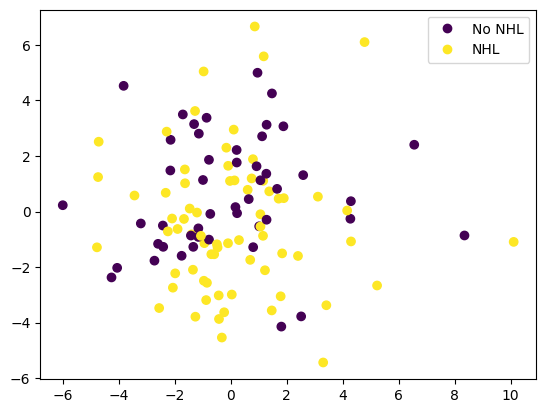

In [45]:
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline

X, y = create_dataset(clean_raw_data(f"../{DATA_DIR}Brdi_db_march.xlsx"), target_col="NHL")
pca = PCA(n_components=.8, random_state=SEED)
pipe = Pipeline([('scaler', StandardScaler()), ('pca', pca)])
Xt = pipe.fit_transform(X)
plot = plt.scatter(Xt[:,0], Xt[:,1], c=y)
plt.legend(handles=plot.legend_elements()[0], labels=['No NHL', 'NHL'])
plt.show()

## function to get different types of cross validation

In [46]:
def get_cross_validation(X, y, test_size=.2, n_splits=10, type="stratified", random_state=SEED):
    if type == "stratified":
        return list(StratifiedShuffleSplit(test_size=test_size, n_splits=n_splits, random_state=random_state).split(X, y))
    elif type == "leave_one_out":
        return list(LeaveOneOut().split(X, y))
    elif type=="K-Fold":
        return list(KFold(n_splits=n_splits, random_state=random_state, shuffle=True).split(X, y))

In [47]:
def seaborn_conf_matrix(cm, model_name, result_dir="../figures/confusion_matricies"):
    plt.figure()
    plt.title(f"{model_name} Confusion Matrix")
    group_names = ["True Neg","False Pos","False Neg","True Pos"]
    group_counts = ["{0:0.0f}".format(value) for value in cm.flatten()]
    group_percentages = ["{0:.2%}".format(value) for value in cm.flatten()/np.sum(cm)]
    labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in zip(group_names,group_counts,group_percentages)]
    labels = np.asarray(labels).reshape(2,2)
    sns.heatmap(cm, annot=labels, fmt='', cmap='Blues')
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.savefig(f"{result_dir}/{model_name}_conf_matrix.png")

## Tune SVM

In [48]:
def graph_cv_results(results_df):
    plt.figure()
    # Plot loss scores using seaborn
    
    plt.xticks(rotation=90)
    sns.lineplot(data=results_df, x='params', y='mean_train_score', label='CV Training Score')
    sns.lineplot(data=results_df, x='params', y='mean_test_score', label='CV Test Score')
    plt.xlabel('')
    plt.xticks(ticks=[], labels=[])

In [49]:
from sklearn.metrics import make_scorer

def scorer(*args):
    print(args)
    y_pred = clf.predict(X)
    score = f1_score(y, y_pred)
#     return score
    return 1


overfitting_scorer = make_scorer(scorer, greater_is_better=True)

### Tune instance of model for 1 seed
Note: The decorator "@ray.remote" is useful to run different seeds in parallel using the ray python package

In [66]:
from sklearn.feature_selection import SelectKBest, f_classif, SelectFromModel
from sklearn.svm import LinearSVC
from sklearn.feature_selection import SequentialFeatureSelector
from sklearn.metrics import precision_recall_curve
from sklearn.model_selection import cross_val_score
from sklearn.tree import export_graphviz
from sklearn.tree import plot_tree
import graphviz

@ray.remote
def tune_model(model, param_dist, features=None, n_iter=200, balance=True, weight_classes=False, target_col=None, random_state=SEED):


    X, y = create_dataset(clean_raw_data(f"../{DATA_DIR}Brdi_db_march.xlsx"), target_col=target_col)
    
#     try with actual distribution of players reaching the NHL of 49%
#     sampler = RandomUnderSampler(random_state=42, sampling_strategy={0 : 48, 1 : 47})
#     X, y = sampler.fit_resample(X, y)
    
    X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=.1, random_state=random_state)
  
    cv = get_cross_validation(X_train, y_train, test_size=.1, n_splits=10, type="stratified", random_state=random_state)

    scaler = StandardScaler()
    if balance:
        pipe = ImbPipeline([
                ('smote', SMOTE(random_state=random_state)),
                ('scaler', scaler),
                ('selection', selector),
                ('model', model)
            ])
    else:
#         create pipeline
        pipe = ImbPipeline([
                ('scaler', "passthrough"),
                ('selector', "passthrough"),
                ('model', model)
            ])

#    setup hyperparameter search using Sklearn random search 
    random_search = RandomizedSearchCV(pipe, 
                                        param_distributions=param_dist, 
                                        cv=cv,
                                        n_iter=n_iter,
                                        random_state=random_state,
                                        return_train_score=True,
                                        scoring="f1",
                                        n_jobs=-1,
                                        refit=True)

#   run randomsearch looking for best param configuration on training data

    random_search.fit(X_train, y_train)
    
#   Once hyperparameter search is complete, predict on validation data using best configuration
# Note: since refit=True, randomsearch will automatically refit on all training data using best hyperparameters



# Save the resulting image to a file

    best_estimator = random_search.best_estimator_
    tree = best_estimator.named_steps['model']
#     plt.figure(figsize=(15, 10))
#     plot_tree(tree, class_names=["Did not play", "Played in the NHL"], )
#     plt.savefig('decision_tree.png')
    export_graphviz(tree,
                     out_file="tree.dot",
                     feature_names = X_train.columns, 
                     class_names=["Did not play", "Played in the NHL"],
                     filled = True)
    
    y_pred = random_search.predict(X_val)
    print(f"F1 score on Validation Set: {f1_score(y_val, y_pred)}")

#     return dataframe of metrics from random search 
    return pd.DataFrame([{
                            "Best Estimator" : random_search.best_estimator_,
                            "Best Score" : random_search.best_score_, 
                            "Best Params" : random_search.best_params_, 
                            "Validation Score" : f1_score(y_val, y_pred),
                            "Y Val (Validation)" : np.array(y_val),
                            "Y Pred (Validation)" : np.array(y_pred),
                            "Seed" : random_state,
                            "CV Train Mean" : float(pd.DataFrame.from_dict(random_search.cv_results_)["mean_train_score"].mean()), 
                            "CV Train STD" : float(pd.DataFrame.from_dict(random_search.cv_results_)["std_train_score"].mean()), 
                            "CV Test Mean" : float(pd.DataFrame.from_dict(random_search.cv_results_)["mean_test_score"].mean()),
                            "CV Test STD" : float(pd.DataFrame.from_dict(random_search.cv_results_)["std_test_score"].mean()),
                            }])
    

### Run training for different seeds in parallel

In [51]:
from time import time

def outer_tune_loop(model, param_dist, n_iter=None,target_col="NHL", elastic_net=False):
    start = time()
    model_name = type(model).__name__
    if elastic_net == True:
        if "Bag" in model_name:
            model_name = "BaggingClassifier_ElasticNet"
        elif "Ada" in model_name:
            model_name = "AdaBoostClassifier_ElasticNet"
        else:
            model_name = "ElasticNet"
            
    elif "Bagging" in model_name or "Ada" in model_name:
        model_name = model_name + "_" + model.estimator.__class__.__name__
        

    # random_states = [1, 10, 42, 69, 77, 11, 23, 99, 58, 91]
    random_states = [42, 69, 23, 99,]

    result_ids = [tune_model.remote(clone(model), param_dist, n_iter=n_iter, balance=False, weight_classes=False, target_col="NHL", random_state=random_states[i]) for i in range(len(random_states))]
    print(f"len result ids: {len(result_ids)}")
    outer_loop_results = pd.DataFrame()
    for random_search_cv_results in ray.get(result_ids):
        outer_loop_results = pd.concat([outer_loop_results, random_search_cv_results])

        
    print(f"Mean Validation Score Across {len(random_states)} trials: {round(outer_loop_results['Validation Score'].mean(), 3)}")
   
        
    outer_loop_results.to_excel(f"../{RESULTS_DIR}{model_name}.xlsx", index=False)
    print(f"Training time for {len(random_states)} seeds: {round(time() - start, 3)}")
    return outer_loop_results

### Start of model hyperparameter training
Note: Most models are in the order <br>
    1. Weak (plain / nonensemble) classifier <br>
    2. Bagging classifier (ensemble 1) <br>
    2. Boosting classifier (ensemble 2)

## SVC

## TODO 3
Play around with different feature selector / scaler combinations. Standard scaler is generally what most people use so I could imagine some exploration into picking that as the only scaler and then doing tuning. Same with the selector where we isolate one scaler/selector and then see if we get better or worse results. 

In [36]:
model = SVC(random_state=SEED)
param_dist = {
    "selector" : [
            None,
            SelectFromModel(LinearSVC(random_state=SEED, penalty="l1", dual=False)),
            SelectFromModel(ExtraTreesClassifier(random_state=SEED)), 
#             NamedFeatureSelector(["Delta_MT", "Delta_AE", "cvRT_HR", "Corrective_HR", "RT_V", "age"]),
    ],
    'scaler' : [StandardScaler(), MinMaxScaler(), RobustScaler(), None],
    'model__C': [.0001, .001, 1, 3, 5],
    'model__kernel': ['rbf', "linear", "poly", "sigmoid"],
    "model__class_weight" : [None, "balanced"],
}


svc_cv_results = outer_tune_loop(model=model, param_dist=param_dist, n_iter=200,target_col="NHL")
svc_cv_results


len result ids: 4
(tune_model pid=92745) /home/mmoschit/Concussions-and-Athletic-Performance/src
(tune_model pid=92979) /home/mmoschit/Concussions-and-Athletic-Performance/src
(tune_model pid=92975) /home/mmoschit/Concussions-and-Athletic-Performance/src
(tune_model pid=92952) /home/mmoschit/Concussions-and-Athletic-Performance/src
(tune_model pid=92975) F1 score on Validation Set: 0.7777777777777777
(tune_model pid=92952) F1 score on Validation Set: 0.7058823529411764
(tune_model pid=92979) F1 score on Validation Set: 0.5882352941176471
Mean Validation Score Across 4 trials: 0.674
Training time for 4 seeds: 186.572
(tune_model pid=92745) F1 score on Validation Set: 0.625


,Best Estimator,Best Score,Best Params,Validation Score,Y Val (Validation),Y Pred (Validation),Seed,CV Train Mean,CV Train STD,CV Test Mean,CV Test STD
0,"(RobustScaler(), None, SVC(C=5, kernel='poly', random_state=42))",0.706275,"{'selector': None, 'scaler': RobustScaler(), 'model__kernel': 'poly', 'model__class_weight': None, 'model__C': 5}",0.777778,"[1, 0, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1]","[1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]",42,0.605140,0.021697,0.464184,0.079790
0,"(RobustScaler(), None, SVC(C=1, kernel='sigmoid', random_state=42))",0.752255,"{'selector': None, 'scaler': RobustScaler(), 'model__kernel': 'sigmoid', 'model__class_weight': None, 'model__C': 1}",0.705882,"[1, 1, 0, 1, 0, 0, 1, 0, 1, 1, 1, 0]","[1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0]",69,0.692189,0.018816,0.590785,0.060271
0,"(StandardScaler(), SelectFromModel(estimator=ExtraTreesClassifier(random_state=42)), SVC(C=3, kernel='linear', random_state=42))",0.731639,"{'selector': SelectFromModel(estimator=ExtraTreesClassifier(random_state=42)), 'scaler': StandardScaler(), 'model__kernel': 'linear', 'model__class_weight': None, 'model__C': 3}",0.625000,"[0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0]","[1, 1, 1, 1, 0, 1, 0, 1, 1, 0, 1, 0]",23,0.611920,0.022452,0.517846,0.074472
0,"(MinMaxScaler(), None, SVC(C=5, class_weight='balanced', kernel='sigmoid', random_state=42))",0.793301,"{'selector': None, 'scaler': MinMaxScaler(), 'model__kernel': 'sigmoid', 'model__class_weight': 'balanced', 'model__C': 5}",0.588235,"[0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1]","[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]",99,0.772036,0.021648,0.702775,0.075721


(tune_model pid=92952) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=92952)   warnings.warn(
(tune_model pid=92952) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=92952)   warnings.warn(
(tune_model pid=92952) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=92952)   warnings.warn(
(tune_model pid=92952) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iteratio

In [31]:
model = BaggingClassifier(estimator=SVC(random_state=SEED), random_state=SEED)
param_dist = {
        "selector" : [
                    None,
                    SelectFromModel(LinearSVC(random_state=SEED, penalty="l1", dual=False)),
                    SelectFromModel(ExtraTreesClassifier(random_state=SEED)), 
                    NamedFeatureSelector(["Delta_MT", "Delta_AE", "cvRT_HR", "Corrective_HR", "RT_V", "age"]),
            ],
        'scaler' : [MinMaxScaler()],
        'model__estimator__C': [.0001, .001, 1, 5],
        'model__estimator__kernel': ['linear', 'rbf', 'poly'],
        'model__n_estimators': [5, 10, 50],
        "model__estimator__class_weight" : [None, "balanced"]
    }

bagged_svc_cv_results = outer_tune_loop(model=model, param_dist=param_dist, n_iter=100,target_col="NHL")
bagged_svc_cv_results

len result ids: 4
(tune_model pid=92745) /home/mmoschit/Concussions-and-Athletic-Performance/src
(tune_model pid=92979) /home/mmoschit/Concussions-and-Athletic-Performance/src
(tune_model pid=92975) /home/mmoschit/Concussions-and-Athletic-Performance/src
(tune_model pid=92952) /home/mmoschit/Concussions-and-Athletic-Performance/src
(tune_model pid=92745) F1 score on Validation Set: 0.8
(tune_model pid=92975) F1 score on Validation Set: 0.5882352941176471
(tune_model pid=92952) F1 score on Validation Set: 0.7368421052631579
Mean Validation Score Across 4 trials: 0.688
Training time for 4 seeds: 5.121
(tune_model pid=92979) F1 score on Validation Set: 0.625


,Best Estimator,Best Score,Best Params,Validation Score,Y Val (Validation),Y Pred (Validation),Seed,CV Train Mean,CV Train STD,CV Test Mean,CV Test STD
0,"(MinMaxScaler(), <__main__.NamedFeatureSelector object at 0x7f1f9927ecd0>, (SVC(C=1, kernel='linear', random_state=1952926171), SVC(C=1, kernel='linear', random_state=1761383086), SVC(C=1, kernel='linear', random_state=1449071958), SVC(C=1, kernel='linear', random_state=1910541088), SVC(C=1, kernel='linear', random_state=1341730541), SVC(C=1, kernel='linear', random_state=1286572245), SVC(C=1, kernel='linear', random_state=1005142668), SVC(C=1, kernel='linear', random_state=502852014), SVC(C=1, kernel='linear', random_state=186414760), SVC(C=1, kernel='linear', random_state=1956263048), SVC(C=1, kernel='linear', random_state=15592051), SVC(C=1, kernel='linear', random_state=1628376228), SVC(C=1, kernel='linear', random_state=1638437331), SVC(C=1, kernel='linear', random_state=116435712), SVC(C=1, kernel='linear', random_state=588556688), SVC(C=1, kernel='linear', random_state=358068376), SVC(C=1, kernel='linear', random_state=67998415), SVC(C=1, kernel='linear', random_state=825108120), SVC(C=1, kernel='linear', random_state=1237545031), SVC(C=1, kernel='linear', random_state=1708477288), SVC(C=1, kernel='linear', random_state=420198453), SVC(C=1, kernel='linear', random_state=1930947788), SVC(C=1, kernel='linear', random_state=1419989711), SVC(C=1, kernel='linear', random_state=1242586904), SVC(C=1, kernel='linear', random_state=1836411051), SVC(C=1, kernel='linear', random_state=1419187828), SVC(C=1, kernel='linear', random_state=1418767096), SVC(C=1, kernel='linear', random_state=694812580), SVC(C=1, kernel='linear', random_state=1521681307), SVC(C=1, kernel='linear', random_state=649915709), SVC(C=1, kernel='linear', random_state=1825994202), SVC(C=1, kernel='linear', random_state=165552663), SVC(C=1, kernel='linear', random_state=563832979), SVC(C=1, kernel='linear', random_state=156769028), SVC(C=1, kernel='linear', random_state=1401477181), SVC(C=1, kernel='linear', random_state=157012377), SVC(C=1, kernel='linear', random_state=1860142520), SVC(C=1, kernel='linear', random_state=1511608169), SVC(C=1, kernel='linear', random_state=898468456), SVC(C=1, kernel='linear', random_state=1883945839), SVC(C=1, kernel='linear', random_state=931130203), SVC(C=1, kernel='linear', random_state=2053587271), SVC(C=1, kernel='linear', random_state=199146950), SVC(C=1, kernel='linear', random_state=1988060306), SVC(C=1, kernel='linear', random_state=488366064), SVC(C=1, kernel='linear', random_state=1329600956), SVC(C=1, kernel='linear', random_state=1277899086), SVC(C=1, kernel='linear', random_state=17880268), SVC(C=1, kernel='linear', random_state=1943369825), SVC(C=1, kernel='linear', random_state=2095141690)))",0.714706,"{'selector': <__main__.NamedFeatureSelector object at 0x7f1f9924c550>, 'scaler': MinMaxScaler(), 'model__n_estimators': 50, 'model__estimator__kernel': 'linear', 'model__estimator__class_weight': None, 'model__estimator__C': 1}",0.800000,"[1, 0, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1]","[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]",42,0.620123,0.072680,0.463165,0.125714
0,"(MinMaxScaler(), SelectFromModel(estimator=LinearSVC(dual=False, penalty='l1', random_state=42)), (SVC(C=0.001, kernel='linear', random_state=1952926171), SVC(C=0.001, kernel='linear', random_state=1761383086), SVC(C=0.001, kernel='linear', random_state=1449071958), SVC(C=0.001, kernel='linear', random_state=1910541088), SVC(C=0.001, kernel='linear', random_state=1341730541)))",0.705882,"{'selector': SelectFromModel(estimator=LinearSVC(dual=False, penalty='l1', random_state=42)), 'scaler': MinMaxScaler(), 'model__n_estimators': 5, 'model__estimator__kernel': 'linear', 'model__estimator__class_weight': None, 'model__estimator__C': 0.001}",0.736842,"[1, 1, 0, 1, 0, 0, 1, 0, 1, 1, 1, 0]","[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]",69,0.715917,0.087001,0.602095,0.123362
0,"(MinMaxScaler(), SelectFromModel(estimator=Line

In [ ]:
model = AdaBoostClassifier(estimator=SVC(random_state=SEED), random_state=SEED, algorithm='SAMME')
param_dist = {
        "selector" : [
                    None,
                    SelectFromModel(LinearSVC(random_state=SEED, penalty="l1", dual=False)),
                    SelectFromModel(ExtraTreesClassifier(random_state=SEED)), 
                    NamedFeatureSelector(["Delta_MT", "Delta_AE", "cvRT_HR", "Corrective_HR", "RT_V", "age"]),
            ],
        'scaler' : [MinMaxScaler()],
        'model__estimator__C': [.0001, .001, 1, 5],
        'model__estimator__kernel': ['linear', 'rbf', 'poly',],
        'model__n_estimators': [5, 10, 50],
        "model__estimator__class_weight" : [None, "balanced"]
    }

boosted_svc_cv_results = outer_tune_loop(model=model, param_dist=param_dist, n_iter=100,target_col="NHL")
boosted_svc_cv_results

len result ids: 4
(tune_model pid=2391211) /home/mmoschit/Concussions-and-Athletic-Performance/src
(tune_model pid=2391454) /home/mmoschit/Concussions-and-Athletic-Performance/src
(tune_model pid=2391176) /home/mmoschit/Concussions-and-Athletic-Performance/src
(tune_model pid=2391425) /home/mmoschit/Concussions-and-Athletic-Performance/src


## Light Gradient Boosting

In [ ]:
model = LGBMClassifier(random_state=SEED)
param_dist = {
#         'scaler' : [StandardScaler(), MinMaxScaler(), RobustScaler(), None],
        'scaler' : [MinMaxScaler()],
        "selector" : [
            None,
            SelectFromModel(LinearSVC(random_state=SEED, penalty="l1", dual=False)),
            SelectFromModel(ExtraTreesClassifier(random_state=SEED)), 
            NamedFeatureSelector(["Delta_MT", "Delta_AE", "cvRT_HR", "Corrective_HR", "RT_V", "age"]),
        ],
        "model__boosting_type": ["gbdt", "dart"],
        "model__num_leaves": [2, 5, 10, 20],
        "model__learning_rate": [0.01, 0.05, 0.1, 0.2],
        "model__max_depth": [1, 3, 5, 7],
        "model__min_child_samples": [1, 5, 10, 20],
        "model__subsample": [0.5, 0.7, 0.9],
        "model__colsample_bytree": [0.5, 0.7, 0.9],
        "model__class_weight" : ["balanced", None],
    }

lgbm_cv_results = outer_tune_loop(model=model, param_dist=param_dist, n_iter=25,target_col="NHL")
lgbm_cv_results

In [20]:
model = BaggingClassifier(estimator=LGBMClassifier(random_state=SEED), random_state=SEED)

param_dist = {
#         'scaler' : [StandardScaler(), MinMaxScaler(), RobustScaler(), None],
        'scaler' : [MinMaxScaler()],
        "selector" : [
            None,
            SelectFromModel(LinearSVC(random_state=SEED, penalty="l1", dual=False)),
            SelectFromModel(ExtraTreesClassifier(random_state=SEED)), 
            NamedFeatureSelector(["Delta_MT", "Delta_AE", "cvRT_HR", "Corrective_HR", "RT_V", "age"]),
        ],
        "model__estimator__boosting_type": ["gbdt", "dart"],
        "model__estimator__num_leaves": [2, 5, 10, 20],
        "model__estimator__learning_rate": [0.01, 0.05, 0.1, 0.2],
        "model__estimator__max_depth": [1, 3, 5, 7],
        "model__estimator__min_child_samples": [1, 5, 10, 20],
        "model__estimator__subsample": [0.5, 0.7, 0.9],
        "model__estimator__colsample_bytree": [0.5, 0.7, 0.9],
        "model__estimator__class_weight" : ["balanced", None],
        'model__n_estimators': [5, 10, 50],
        
    }

bagged_lgbm_cv_results = outer_tune_loop(model=model, param_dist=param_dist, n_iter=100,target_col="NHL")
bagged_lgbm_cv_results


len result ids: 4
(tune_model pid=2632582) /home/mmoschit/Concussions-and-Athletic-Performance/src
(tune_model pid=2632574) /home/mmoschit/Concussions-and-Athletic-Performance/src
(tune_model pid=2632595) /home/mmoschit/Concussions-and-Athletic-Performance/src
(tune_model pid=2632573) /home/mmoschit/Concussions-and-Athletic-Performance/src
(tune_model pid=2632595) F1 score on Validation Set: 0.6666666666666666
(tune_model pid=2632573) F1 score on Validation Set: 0.8
(tune_model pid=2632574) F1 score on Validation Set: 0.75
Mean Validation Score Across 4 trials: 0.76
(tune_model pid=2632582) F1 score on Validation Set: 0.8235294117647058
Training time for 4 seeds: 16.643


Best Estimator  \
0                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                         (MinMaxScaler(), SelectFromModel(estimator=LinearSVC(dual=False, penalty='l1', random_state=42)), (LGBMClassifier(colsample_bytree=0.7, learning_rate=0.01, max_depth=1,\n               min_child_samples=5, num_leaves=5, random_state=1952926171,\n               subsample=0.7), LGBMClassifier(colsample_bytree=0.7, learning_rate=0.01, max_depth=1,\n               min_child_samples=5, num_leaves=5, random_state=1761383086,\n               subsample=0.7), LGBMClassifier(colsample_bytree=0.7, learning_rate=0.01, max_depth=1,\n               min_child_samples=5, num_leaves=5, random_state=1449071958,\n               subsample=0.7), LGBMClassifier(colsample_bytree=0.7, learning_rate=0.01, max_depth=1,\n               min_child_samples=5, num_leaves=5, random_state=1910541088,\n               subsample=0.7), LGBMClassifier(colsample_bytree=0.7, learning_rate=0.01, max_depth=1,\n               min_child_samples=5, num_leaves=5, random_state=1341730541,\n               subsample=0.7), LGBMClassifier(colsample_bytree=0.7, learning_rate=0.01, max_depth=1,\n               min_child_samples=5, num_leaves=5, random_state=1286572245,\n               subsample=0.7), LGBMClassifier(colsample_bytree=0.7, learning_rate=0.01, max_depth=1,\n               min_child_samples=5, num_leaves=5, random_state=1005142668,\n               subsample=0.7), LGBMClassifier(colsample_bytree=0.7, learning_rate=0.01, max_depth=1,\n               min_child_samples=5, num_leaves=5, random_state=502852014,\n               subsample=0.7), LGBMClassifier(colsample_bytree=0.7, learning_rate=0.01, max_depth=1,\n               min_child_samples=5, num_leaves=5, random_state=186414760,\n               subsample=0.7), LGBMClassifier(colsample_bytree=0.7, learning_rate=0.01, max_depth=1,\n               min_child_samples=5, num_leaves=5, random_state=1956263048,\n               subsample=0.7), LGBMClassifier(colsample_bytree=0.7, learning_rate=0.01, max_depth=1,\n               min_child_samples=5, num_leaves=5, random_state=15592051,\n               subsample=0.7), LGBMClassifier(colsample_bytree=0.7, learning_rate=0.01, max_depth=1,\n               min_child_samples=5, num_leaves=5, random_state=1628376228,\n               subsample=0.7), LGBMClassifier(colsample_bytree=0.7, learning_rate=0.01, max_depth=1,\n               min_child_samples=5, num_leaves=5, random_state=1638437331,\n               subsample=0.7), LGBMClassifier(colsample_bytree=0.7, learning_rate=0.01, max_depth=1,\n               min_child_samples=5, num_leaves=5, random_state=116435712,\n               subsample=0.7), LGBMClassifier(colsample_bytree=0.7, learning_rate=0.01, max_depth=1,\n               min_child_samples=5, num_leaves=5, random_state=588556688,\n               subsample=0.7), LGBMClassifier(colsample_bytree=0.7, learning_rate=0.01, max_depth=1,\n               min

In [21]:
model = AdaBoostClassifier(estimator=LGBMClassifier(random_state=SEED), random_state=SEED)

param_dist = {
#         'scaler' : [StandardScaler(), MinMaxScaler(), RobustScaler(), None],
        'scaler' : [MinMaxScaler()],
        "selector" : [
            None,
            SelectFromModel(LinearSVC(random_state=SEED, penalty="l1", dual=False)),
            SelectFromModel(ExtraTreesClassifier(random_state=SEED)), 
            NamedFeatureSelector(["Delta_MT", "Delta_AE", "cvRT_HR", "Corrective_HR", "RT_V", "age"]),
        ],
        "model__estimator__boosting_type": ["gbdt", "dart"],
        "model__estimator__num_leaves": [2, 5, 10, 20],
        "model__estimator__learning_rate": [0.01, 0.05, 0.1, 0.2],
        "model__estimator__max_depth": [1, 3, 5, 7],
        "model__estimator__min_child_samples": [1, 5, 10, 20],
        "model__estimator__subsample": [0.5, 0.7, 0.9],
        "model__estimator__colsample_bytree": [0.5, 0.7, 0.9],
        "model__estimator__class_weight" : ["balanced", None],
        'model__n_estimators': [5, 10, 50, 100],
        
    }

bagged_lgbm_cv_results = outer_tune_loop(model=model, param_dist=param_dist, n_iter=50,target_col="NHL")
bagged_lgbm_cv_results

len result ids: 4
(tune_model pid=2632582) /home/mmoschit/Concussions-and-Athletic-Performance/src
(tune_model pid=2632574) /home/mmoschit/Concussions-and-Athletic-Performance/src
(tune_model pid=2632595) /home/mmoschit/Concussions-and-Athletic-Performance/src
(tune_model pid=2632573) /home/mmoschit/Concussions-and-Athletic-Performance/src
(tune_model pid=2632573) F1 score on Validation Set: 0.7368421052631579
(tune_model pid=2632574) F1 score on Validation Set: 0.6666666666666665
(tune_model pid=2632582) F1 score on Validation Set: 0.888888888888889
(tune_model pid=2632595) F1 score on Validation Set: 0.7142857142857143
Mean Validation Score Across 4 trials: 0.752
Training time for 4 seeds: 5.228


Best Estimator  \
0                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                             

## ElasticNet

In [139]:
model = LogisticRegression(random_state=SEED, max_iter=1000)
param_dist = {
    "selector" : [
            None,
            SelectFromModel(LinearSVC(random_state=SEED, penalty="l1", dual=False)),
            SelectFromModel(ExtraTreesClassifier(random_state=SEED)), 
            NamedFeatureSelector(["Delta_MT", "Delta_AE", "cvRT_HR", "Corrective_HR", "RT_V", "age"]),
    ],
    'scaler' : [MinMaxScaler()],
    'model__l1_ratio': [0.5, .1, .01, .3, .7, .95],
    'model__penalty': ['elasticnet'],
    'model__solver': ['saga'],
    'model__class_weight': [None, 'balanced']
}

lr_cv_results = outer_tune_loop(model=model, param_dist=param_dist, n_iter=100,target_col="NHL", elastic_net=True)
lr_cv_results

elastic_net:  True model name LogisticRegression
bag in model name:  False
model name after:  ElasticNet
len result ids: 4
(tune_model pid=2819215) /home/mmoschit/Concussions-and-Athletic-Performance/src
(tune_model pid=2819155) /home/mmoschit/Concussions-and-Athletic-Performance/src
(tune_model pid=2819345) /home/mmoschit/Concussions-and-Athletic-Performance/src
(tune_model pid=2819327) /home/mmoschit/Concussions-and-Athletic-Performance/src


(tune_model pid=2819345) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/model_selection/_search.py:305: UserWarning: The total space of parameters 48 is smaller than n_iter=100. Running 48 iterations. For exhaustive searches, use GridSearchCV.
(tune_model pid=2819345)   warnings.warn(
(tune_model pid=2819215) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/model_selection/_search.py:305: UserWarning: The total space of parameters 48 is smaller than n_iter=100. Running 48 iterations. For exhaustive searches, use GridSearchCV.
(tune_model pid=2819215)   warnings.warn(
(tune_model pid=2819327) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/model_selection/_search.py:305: UserWarning: The total space of parameters 48 is smaller than n_iter=100. Running 48 iterations. For exhaustive searches, use GridSearchCV.
(tune_model pid=2819327)   warnings.warn(
(

(tune_model pid=2819215) F1 score on Validation Set: 0.7777777777777777
(tune_model pid=2819155) F1 score on Validation Set: 0.7368421052631579
Mean Validation Score Across 4 trials: 0.713
Training time for 4 seeds: 1.765


,Best Estimator,Best Score,Best Params,Validation Score,Y Val (Validation),Y Pred (Validation),Seed,CV Train Mean,CV Train STD,CV Test Mean,CV Test STD
0,"(MinMaxScaler(), SelectFromModel(estimator=ExtraTreesClassifier(random_state=42)), LogisticRegression(l1_ratio=0.7, max_iter=1000, penalty='elasticnet',\n random_state=42, solver='saga'))",0.675000,"{'selector': SelectFromModel(estimator=ExtraTreesClassifier(random_state=42)), 'scaler': MinMaxScaler(), 'model__solver': 'saga', 'model__penalty': 'elasticnet', 'model__l1_ratio': 0.7, 'model__class_weight': None}",0.750000,"[1, 0, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1]","[1, 1, 1, 1, 1, 1, 0, 0, 1, 0, 0, 1]",42,0.722619,0.020609,0.570827,0.119567
0,"(MinMaxScaler(), <__main__.NamedFeatureSelector object at 0x7f84bc13a220>, LogisticRegression(l1_ratio=0.95, max_iter=1000, penalty='elasticnet',\n random_state=42, solver='saga'))",0.705882,"{'selector': <__main__.NamedFeatureSelector object at 0x7f84bc13a280>, 'scaler': MinMaxScaler(), 'model__solver': 'saga', 'model__penalty': 'elasticnet', 'model__l1_ratio': 0.95, 'model__class_weight': None}",0.736842,"[1, 1, 0, 1, 0, 0, 1, 0, 1, 1, 1, 0]","[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]",69,0.720660,0.018635,0.645937,0.109780
0,"(MinMaxScaler(), SelectFromModel(estimator=ExtraTreesClassifier(random_state=42)), LogisticRegression(l1_ratio=0.7, max_iter=1000, penalty='elasticnet',\n random_state=42, solver='saga'))",0.729608,"{'selector': SelectFromModel(estimator=ExtraTreesClassifier(random_state=42)), 'scaler': MinMaxScaler(), 'model__solver': 'saga', 'model__penalty': 'elasticnet', 'model__l1_ratio': 0.7, 'model__class_weight': None}",0.777778,"[0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0]","[1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0]",23,0.717665,0.020929,0.661174,0.088463
0,"(MinMaxScaler(), SelectFromModel(estimator=ExtraTreesClassifier(random_state=42)), LogisticRegression(l1_ratio=0.3, max_iter=1000, penalty='elasticnet',\n random_state=42, solver='saga'))",0.784183,"{'selector': SelectFromModel(estimator=ExtraTreesClassifier(random_state=42)), 'scaler': MinMaxScaler(), 'model__solver': 'saga', 'model__penalty': 'elasticnet', 'model__l1_ratio': 0.3, 'model__class_weight': None}",0.588235,"[0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1]","[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]",99,0.731486,0.015865,0.702239,0.085652


In [140]:
model = BaggingClassifier(estimator=LogisticRegression(random_state=SEED, max_iter=1000), random_state=SEED)
param_dist = {
    "selector" : [
            None,
            SelectFromModel(LinearSVC(random_state=SEED, penalty="l1", dual=False,)),
            SelectFromModel(ExtraTreesClassifier(random_state=SEED)), 
            NamedFeatureSelector(["Delta_MT", "Delta_AE", "cvRT_HR", "Corrective_HR", "RT_V", "age"]),
    ],
    'scaler' : [MinMaxScaler()],
    'model__estimator__l1_ratio': [0.5, .1, .01, .001, .7, .95],
    'model__estimator__penalty': ['elasticnet'],
    'model__estimator__solver': ['saga'],
    'model__n_estimators': [5, 10, 50],
    'model__estimator__class_weight': [None, 'balanced']
}

bagged_lr_cv_results = outer_tune_loop(model=model, param_dist=param_dist, n_iter=50,target_col="NHL", elastic_net=True)
bagged_lr_cv_results

(tune_model pid=2819345) F1 score on Validation Set: 0.5882352941176471
(tune_model pid=2819327) F1 score on Validation Set: 0.75
elastic_net:  True model name BaggingClassifier
bag in model name:  True
model name after:  BaggingClassifier_ElasticNet
len result ids: 4
(tune_model pid=2819215) /home/mmoschit/Concussions-and-Athletic-Performance/src
(tune_model pid=2819155) /home/mmoschit/Concussions-and-Athletic-Performance/src
(tune_model pid=2819345) /home/mmoschit/Concussions-and-Athletic-Performance/src
(tune_model pid=2819327) /home/mmoschit/Concussions-and-Athletic-Performance/src
(tune_model pid=2819345) F1 score on Validation Set: 0.7368421052631579
(tune_model pid=2819155) F1 score on Validation Set: 0.5882352941176471
(tune_model pid=2819327) F1 score on Validation Set: 0.7368421052631579
Mean Validation Score Across 4 trials: 0.692
Training time for 4 seeds: 4.668
(tune_model pid=2819215) F1 score on Validation Set: 0.7058823529411765


Best Estimator  \
0                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                             

In [141]:
model = AdaBoostClassifier(estimator=LogisticRegression(random_state=SEED, max_iter=1000), random_state=SEED)
param_dist = {
    "selector" : [
            None,
            SelectFromModel(LinearSVC(random_state=SEED, penalty="l1", dual=False,)),
            SelectFromModel(ExtraTreesClassifier(random_state=SEED)), 
            NamedFeatureSelector(["Delta_MT", "Delta_AE", "cvRT_HR", "Corrective_HR", "RT_V", "age"]),
    ],
    'scaler' : [MinMaxScaler()],
    'model__estimator__l1_ratio': [0.5, .1, .01, .001, .7, .95],
    'model__estimator__penalty': ['elasticnet'],
    'model__estimator__solver': ['saga'],
    'model__n_estimators': [5, 10, 50],
    'model__estimator__class_weight': [None, 'balanced']
}

boosted_lr_cv_results = outer_tune_loop(model=model, param_dist=param_dist, n_iter=50,target_col="NHL", elastic_net=True)
boosted_lr_cv_results

elastic_net:  True model name AdaBoostClassifier
bag in model name:  False
model name after:  AdaBoostClassifier_ElasticNet
len result ids: 4
(tune_model pid=2819215) /home/mmoschit/Concussions-and-Athletic-Performance/src
(tune_model pid=2819155) /home/mmoschit/Concussions-and-Athletic-Performance/src
(tune_model pid=2819345) /home/mmoschit/Concussions-and-Athletic-Performance/src
(tune_model pid=2819327) /home/mmoschit/Concussions-and-Athletic-Performance/src
(tune_model pid=2819215) F1 score on Validation Set: 0.8
(tune_model pid=2819155) F1 score on Validation Set: 0.7777777777777777
(tune_model pid=2819345) F1 score on Validation Set: 0.5882352941176471
Mean Validation Score Across 4 trials: 0.726
Training time for 4 seeds: 3.596
(tune_model pid=2819327) F1 score on Validation Set: 0.7368421052631579


Best Estimator  \
0                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                             

## Decision Tree

In [67]:
model = DecisionTreeClassifier(random_state=SEED)
param_dist = {
        'scaler' : [StandardScaler(), MinMaxScaler(), RobustScaler(), None],
        "selector" : [
            RandomUnderSampler(random_state=42)
#             SelectFromModel(LinearSVC(random_state=SEED, penalty="l1", dual=False)),
#             SelectFromModel(ExtraTreesClassifier(random_state=SEED)), 
#             NamedFeatureSelector(["Delta_MT", "Delta_AE", "cvRT_HR", "Corrective_HR", "RT_V", "age"]),
        ],
        "model__criterion" : ["gini", "entropy"],
        "model__max_depth" : [1, 3, 5, 10, 15],
        "model__min_samples_split" : [2, 5, 7, 9],
        "model__min_samples_leaf" : [1,2,5, 7, 9],
        "model__max_features" : ["sqrt", "log2", None],
        "model__class_weight" : ["balanced", None],
    }

dt_cv_results = outer_tune_loop(model=model, param_dist=param_dist, n_iter=250,target_col="NHL")
dt_cv_results


len result ids: 4
(tune_model pid=842917) /home/mmoschit/Concussions-and-Athletic-Performance/src
(tune_model pid=842914) /home/mmoschit/Concussions-and-Athletic-Performance/src
(tune_model pid=842926) /home/mmoschit/Concussions-and-Athletic-Performance/src
(tune_model pid=842928) /home/mmoschit/Concussions-and-Athletic-Performance/src
(tune_model pid=842914) F1 score on Validation Set: 0.75
(tune_model pid=842926) F1 score on Validation Set: 0.5882352941176471
Mean Validation Score Across 4 trials: 0.696
(tune_model pid=842917) F1 score on Validation Set: 0.5714285714285715
(tune_model pid=842928) F1 score on Validation Set: 0.8750000000000001
Training time for 4 seeds: 2.612


,Best Estimator,Best Score,Best Params,Validation Score,Y Val (Validation),Y Pred (Validation),Seed,CV Train Mean,CV Train STD,CV Test Mean,CV Test STD
0,"(None, RandomUnderSampler(random_state=42), DecisionTreeClassifier(criterion='entropy', max_depth=3, max_features='log2',\n min_samples_leaf=7, random_state=42))",0.579771,"{'selector': RandomUnderSampler(random_state=42), 'scaler': None, 'model__min_samples_split': 2, 'model__min_samples_leaf': 7, 'model__max_features': 'log2', 'model__max_depth': 3, 'model__criterion': 'entropy', 'model__class_weight': None}",0.750000,"[1, 0, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1]","[1, 1, 0, 1, 1, 1, 0, 0, 1, 1, 0, 1]",42,0.709183,0.072877,0.442019,0.190624
0,"(StandardScaler(), RandomUnderSampler(random_state=42), DecisionTreeClassifier(max_depth=15, max_features='sqrt', min_samples_leaf=7,\n random_state=42))",0.629004,"{'selector': RandomUnderSampler(random_state=42), 'scaler': StandardScaler(), 'model__min_samples_split': 2, 'model__min_samples_leaf': 7, 'model__max_features': 'sqrt', 'model__max_depth': 15, 'model__criterion': 'gini', 'model__class_weight': None}",0.875000,"[1, 1, 0, 1, 0, 0, 1, 0, 1, 1, 1, 0]","[1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 0]",69,0.724409,0.075671,0.492934,0.169370
0,"(StandardScaler(), RandomUnderSampler(random_state=42), DecisionTreeClassifier(criterion='entropy', max_depth=15, min_samples_split=9,\n random_state=42))",0.668865,"{'selector': RandomUnderSampler(random_state=42), 'scaler': StandardScaler(), 'model__min_samples_split': 9, 'model__min_samples_leaf': 1, 'model__max_features': None, 'model__max_depth': 15, 'model__criterion': 'entropy', 'model__class_weight': None}",0.571429,"[0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0]","[0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0]",23,0.732497,0.068451,0.544144,0.169993
0,"(RobustScaler(), RandomUnderSampler(random_state=42), DecisionTreeClassifier(criterion='entropy', max_depth=3, min_samples_leaf=5,\n min_samples_split=7, random_state=42))",0.672174,"{'selector': RandomUnderSampler(random_state=42), 'scaler': RobustScaler(), 'model__min_samples_split': 7, 'model__min_samples_leaf': 5, 'model__max_features': None, 'model__max_depth': 3, 'model__criterion': 'entropy', 'model__class_weight': None}",0.588235,"[0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1]","[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]",99,0.705021,0.077538,0.546535,0.177855


In [68]:
!dot -Tpng -Gdpi=300 tree. dot -o tree.png

/bin/bash: dot: command not found


In [34]:
model = BaggingClassifier(estimator=DecisionTreeClassifier(random_state=SEED), random_state=SEED)
param_dist = {
        "selector" : [
            RandomUnderSampler(random_state=42)
#             None,
#             SelectFromModel(LinearSVC(random_state=SEED, penalty="l1", dual=False)),
#             SelectFromModel(ExtraTreesClassifier(random_state=SEED)), 
#             NamedFeatureSelector(["Delta_MT", "Delta_AE", "cvRT_HR", "Corrective_HR", "RT_V", "age"]),
        ],
        'scaler' : [MinMaxScaler()],
        "model__n_estimators" : [5, 10, 50],
        "model__estimator__criterion" : ["gini", "entropy"],
        "model__estimator__max_depth" : range(1, 7),
        "model__estimator__min_samples_split" : range(2, 7),
        "model__estimator__min_samples_leaf" : range(1, 7),
        "model__estimator__max_features" : ["sqrt", "log2", None],
        "model__estimator__class_weight" : [None, "balanced"]
    }



bagged_dt_cv_results = outer_tune_loop(model=model, param_dist=param_dist, n_iter=250,target_col="NHL")
bagged_dt_cv_results


(tune_model pid=2632595) F1 score on Validation Set: 0.8
len result ids: 4
(tune_model pid=2632582) /home/mmoschit/Concussions-and-Athletic-Performance/src
(tune_model pid=2632574) /home/mmoschit/Concussions-and-Athletic-Performance/src
(tune_model pid=2632595) /home/mmoschit/Concussions-and-Athletic-Performance/src
(tune_model pid=2632573) /home/mmoschit/Concussions-and-Athletic-Performance/src
(tune_model pid=2632582) F1 score on Validation Set: 0.8750000000000001
(tune_model pid=2632595) F1 score on Validation Set: 0.7777777777777777
(tune_model pid=2632573) F1 score on Validation Set: 0.7777777777777777
Mean Validation Score Across 4 trials: 0.755
Training time for 4 seeds: 12.36
(tune_model pid=2632574) F1 score on Validation Set: 0.5882352941176471


Best Estimator  \
0                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                             

In [35]:
model = AdaBoostClassifier(estimator=DecisionTreeClassifier(random_state=SEED), random_state=SEED)
param_dist = {
        "selector" : [
            RandomUnderSampler(random_state=42)
#             None,
#             SelectFromModel(LinearSVC(random_state=SEED, penalty="l1", dual=False)),
#             SelectFromModel(ExtraTreesClassifier(random_state=SEED)), 
#             NamedFeatureSelector(["Delta_MT", "Delta_AE", "cvRT_HR", "Corrective_HR", "RT_V", "age"]),
        ],
        'scaler' : [StandardScaler(), MinMaxScaler(), RobustScaler(), None],
        "model__n_estimators" : [5, 10, 50],
        "model__estimator__criterion" : ["gini", "entropy"],
        "model__estimator__max_depth" : range(1, 7),
        "model__estimator__min_samples_split" : range(2, 7),
        "model__estimator__min_samples_leaf" : range(1, 7),
        "model__estimator__max_features" : ["sqrt", "log2", None],
        "model__estimator__class_weight" : [None, "balanced"]
    }


boosted_svc_cv_results = outer_tune_loop(model=model, param_dist=param_dist, n_iter=100,target_col="NHL")
boosted_svc_cv_results

len result ids: 4
(tune_model pid=2632582) /home/mmoschit/Concussions-and-Athletic-Performance/src
(tune_model pid=2632574) /home/mmoschit/Concussions-and-Athletic-Performance/src
(tune_model pid=2632595) /home/mmoschit/Concussions-and-Athletic-Performance/src
(tune_model pid=2632573) /home/mmoschit/Concussions-and-Athletic-Performance/src
(tune_model pid=2632573) F1 score on Validation Set: 0.75
(tune_model pid=2632582) F1 score on Validation Set: 0.6666666666666666
(tune_model pid=2632595) F1 score on Validation Set: 0.6153846153846154
Mean Validation Score Across 4 trials: 0.714
Training time for 4 seeds: 4.529
(tune_model pid=2632574) F1 score on Validation Set: 0.823529411764706


(tune_model pid=2632574) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=2632574)   warnings.warn(


Best Estimator  \
0                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                             

## Random Forest

In [36]:
model = RandomForestClassifier(random_state=SEED)
param_dist = {
                "selector" : [
                        None,
                        SelectFromModel(LinearSVC(random_state=SEED, penalty="l1", dual=False)),
                        SelectFromModel(ExtraTreesClassifier(random_state=SEED)), 
                        NamedFeatureSelector(["Delta_MT", "Delta_AE", "cvRT_HR", "Corrective_HR", "RT_V", "age"]),
                ],
                'scaler' : [StandardScaler(), MinMaxScaler(), RobustScaler(), None],
                'model__n_estimators': [5, 10, 50],
                "model__max_depth" : range(1, 7),
                "model__min_samples_split" : range(2, 7),
                "model__min_samples_leaf" : range(2, 7),
                'model__max_features': ['sqrt', 'log2']}

rf_cv_results = outer_tune_loop(model=model, param_dist=param_dist, n_iter=100,target_col="NHL")
rf_cv_results

len result ids: 4
(tune_model pid=2632582) /home/mmoschit/Concussions-and-Athletic-Performance/src
(tune_model pid=2632574) /home/mmoschit/Concussions-and-Athletic-Performance/src
(tune_model pid=2632595) /home/mmoschit/Concussions-and-Athletic-Performance/src
(tune_model pid=2632573) /home/mmoschit/Concussions-and-Athletic-Performance/src
(tune_model pid=2632582) F1 score on Validation Set: 0.7058823529411764
(tune_model pid=2632573) F1 score on Validation Set: 0.7142857142857143
(tune_model pid=2632595) F1 score on Validation Set: 0.5882352941176471
Mean Validation Score Across 4 trials: 0.702
(tune_model pid=2632574) F1 score on Validation Set: 0.8
Training time for 4 seeds: 4.111


(tune_model pid=2632574) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=2632574)   warnings.warn(


Best Estimator  \
0  (None, SelectFromModel(estimator=LinearSVC(dual=False, penalty='l1', random_state=42)), (DecisionTreeClassifier(max_depth=1, max_features='sqrt', min_samples_leaf=2,\n                       min_samples_split=5, random_state=1608637542), DecisionTreeClassifier(max_depth=1, max_features='sqrt', min_samples_leaf=2,\n                       min_samples_split=5, random_state=1273642419), DecisionTreeClassifier(max_depth=1, max_features='sqrt', min_samples_leaf=2,\n                       min_samples_split=5, random_state=1935803228), DecisionTreeClassifier(max_depth=1, max_features='sqrt', min_samples_leaf=2,\n                       min_samples_split=5, random_state=787846414), DecisionTreeClassifier(max_depth=1, max_features='sqrt', min_samples_leaf=2,\n                       min_samples_split=5, random_state=996406378), DecisionTreeClassifier(max_depth=1, max_features='sqrt', min_samples_leaf=2,\n                       min_samples_split=5, random_state=1201263687), DecisionTreeClassifier(max_depth=1, max_features='sqrt', min_samples_leaf=2,\n                       min_samples_split=5, random_state=423734972), DecisionTreeClassifier(max_depth=1, max_features='sqrt', min_samples_leaf=2,\n                       min_samples_split=5, random_state=415968276), DecisionTreeClassifier(max_depth=1, max_features='sqrt', min_samples_leaf=2,\n                       min_samples_split=5, random_state=670094950), DecisionTreeClassifier(max_depth=1, max_features='sqrt', min_samples_leaf=2,\n                       min_samples_split=5, random_state=1914837113), DecisionTreeClassifier(max_depth=1, max_features='sqrt', min_samples_leaf=2,\n                       min_samples_split=5, random_state=669991378), DecisionTreeClassifier(max_depth=1, max_features='sqrt', min_samples_leaf=2,\n                       min_samples_split=5, random_state=429389014), DecisionTreeClassifier(max_depth=1, max_features='sqrt', min_samples_leaf=2,\n                       min_samples_split=5, random_state=249467210), DecisionTreeClassifier(max_depth=1, max_features='sqrt', min_samples_leaf=2,\n                       min_samples_split=5, random_state=1972458954), DecisionTreeClassifier(max_depth=1, max_features='sqrt', min_samples_leaf=2,\n                       min_samples_split=5, random_state=1572714583), DecisionTreeClassifier(max_depth=1, max_features='sqrt', min_samples_leaf=2,\n                       min_samples_split=5, random_state=1433267572), DecisionTreeClassifier(max_depth=1, max_features='sqrt', min_samples_leaf=2,\n                       min_samples_split=5, random_state=434285667), DecisionTreeClassifier(max_depth=1, max_features='sqrt', min_samples_leaf=2,\n                       min_samples_split=5, random_state=613608295), DecisionTreeClassifier(max_depth=1, max_features='sqrt', min_samples_leaf=2,\n                       min_samples_split=5, random_state=893664919), DecisionTreeClassifier(max_depth=1, max_features='sqrt', min_samples_leaf=2,\n                       min_samples_split=5, random_state=648061058), DecisionTreeClassifier(max_depth=1, max_features='sqrt', min_samples_leaf=2,\n                       min_samples_split=5, random_state=88409749), DecisionTreeClassifier(max_depth=1, max_features='sqrt', min_samples_leaf=2,\n                       min_samples_split=5, random_state=242285876), DecisionTreeClassifier(max_depth=1, max_features='sqrt', min_samples_leaf=2,\n                       min_samples_split=5, random_state=2018247425), DecisionTreeClassifier(max_depth=1, max_features='sqrt', min_samples_leaf=2,\n                       min_samples_split=5, random_state=953477463), DecisionTreeClassifier(max_depth=1, max_features='sqrt', min_samples_leaf=2,\n                       min_samples_split=5, random_state=1427830251), DecisionTreeClassifier(max_depth=1, max_features='sqrt', min_samples_leaf=2,\n                       min_samples_split=5, random_state=1883569565), DecisionTreeClassifier(max_depth=1, max_features='sqrt', m

In [37]:
model = BaggingClassifier(estimator=RandomForestClassifier(random_state=SEED), random_state=SEED)
param_dist = {
            "selector" : [
                        None,
                        SelectFromModel(LinearSVC(random_state=SEED, penalty="l1", dual=False)),
                        SelectFromModel(ExtraTreesClassifier(random_state=SEED)), 
                        NamedFeatureSelector(["Delta_MT", "Delta_AE", "cvRT_HR", "Corrective_HR", "RT_V", "age"]),
                ],
                'scaler' : [StandardScaler(), MinMaxScaler(), RobustScaler(), None],
                "model__n_estimators" : [5, 10, 50],
                'model__estimator__n_estimators': [5, 10, 50, 100],
                "model__estimator__max_depth" : range(1, 7),
                "model__estimator__min_samples_split" : range(2, 7),
                "model__estimator__min_samples_leaf" : range(1, 7),
                'model__estimator__max_features': ['sqrt', 'log2'],
                "model__estimator__class_weight" : [None, "balanced"]
            }

bagged_rf_cv_results = outer_tune_loop(model=model, param_dist=param_dist, n_iter=100,target_col="NHL")
bagged_rf_cv_results

len result ids: 4
(tune_model pid=2632582) /home/mmoschit/Concussions-and-Athletic-Performance/src
(tune_model pid=2632574) /home/mmoschit/Concussions-and-Athletic-Performance/src
(tune_model pid=2632595) /home/mmoschit/Concussions-and-Athletic-Performance/src
(tune_model pid=2632573) /home/mmoschit/Concussions-and-Athletic-Performance/src
(tune_model pid=2632573) F1 score on Validation Set: 0.75
(tune_model pid=2632574) F1 score on Validation Set: 0.8
(tune_model pid=2632595) F1 score on Validation Set: 0.6666666666666666
Mean Validation Score Across 4 trials: 0.733
(tune_model pid=2632582) F1 score on Validation Set: 0.7142857142857143
Training time for 4 seeds: 61.617


Best Estimator  \
0                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                             

In [38]:
model = AdaBoostClassifier(estimator=RandomForestClassifier(random_state=SEED), random_state=SEED)
param_dist = {
                "selector" : [
                        None,
                        SelectFromModel(LinearSVC(random_state=SEED, penalty="l1", dual=False)),
                        SelectFromModel(ExtraTreesClassifier(random_state=SEED)), 
                        NamedFeatureSelector(["Delta_MT", "Delta_AE", "cvRT_HR", "Corrective_HR", "RT_V", "age"]),
                ],
                'scaler' : [StandardScaler(), MinMaxScaler(), RobustScaler(), None],
                "model__n_estimators" : [5, 10, 50],
                'model__estimator__n_estimators': [5, 10, 50],
                "model__estimator__max_depth" : range(1, 7),
                "model__estimator__min_samples_split" : range(2, 7),
                "model__estimator__min_samples_leaf" : range(1, 7),
                'model__estimator__max_features': ['sqrt', 'log2'],
                "model__estimator__class_weight" : [None, "balanced"]
            }

boosted_rf_cv_results = outer_tune_loop(model=model, param_dist=param_dist, n_iter=100,target_col="NHL")
boosted_rf_cv_results

len result ids: 4
(tune_model pid=2632582) /home/mmoschit/Concussions-and-Athletic-Performance/src
(tune_model pid=2632574) /home/mmoschit/Concussions-and-Athletic-Performance/src
(tune_model pid=2632595) /home/mmoschit/Concussions-and-Athletic-Performance/src
(tune_model pid=2632573) /home/mmoschit/Concussions-and-Athletic-Performance/src
(tune_model pid=2632574) F1 score on Validation Set: 0.5714285714285715
(tune_model pid=2632582) F1 score on Validation Set: 0.7777777777777777
(tune_model pid=2632595) F1 score on Validation Set: 0.75


(tune_model pid=2632573) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=2632573)   warnings.warn(


Mean Validation Score Across 4 trials: 0.681
(tune_model pid=2632573) F1 score on Validation Set: 0.625
Training time for 4 seeds: 25.68


Best Estimator  \
0                       (StandardScaler(), <__main__.NamedFeatureSelector object at 0x7f912436f5e0>, ((DecisionTreeClassifier(max_depth=2, max_features='log2', min_samples_leaf=4,\n                       min_samples_split=6, random_state=1952926171), DecisionTreeClassifier(max_depth=2, max_features='log2', min_samples_leaf=4,\n                       min_samples_split=6, random_state=637209641), DecisionTreeClassifier(max_depth=2, max_features='log2', min_samples_leaf=4,\n                       min_samples_split=6, random_state=1428643706), DecisionTreeClassifier(max_depth=2, max_features='log2', min_samples_leaf=4,\n                       min_samples_split=6, random_state=589855690), DecisionTreeClassifier(max_depth=2, max_features='log2', min_samples_leaf=4,\n                       min_samples_split=6, random_state=296573260), DecisionTreeClassifier(max_depth=2, max_features='log2', min_samples_leaf=4,\n                       min_samples_split=6, random_state=375417474), DecisionTreeClassifier(max_depth=2, max_features='log2', min_samples_leaf=4,\n                       min_samples_split=6, random_state=1372015497), DecisionTreeClassifier(max_depth=2, max_features='log2', min_samples_leaf=4,\n                       min_samples_split=6, random_state=1075473639), DecisionTreeClassifier(max_depth=2, max_features='log2', min_samples_leaf=4,\n                       min_samples_split=6, random_state=2083863132), DecisionTreeClassifier(max_depth=2, max_features='log2', min_samples_leaf=4,\n                       min_samples_split=6, random_state=841518791), DecisionTreeClassifier(max_depth=2, max_features='log2', min_samples_leaf=4,\n                       min_samples_split=6, random_state=1281023960), DecisionTreeClassifier(max_depth=2, max_features='log2', min_samples_leaf=4,\n                       min_samples_split=6, random_state=48968595), DecisionTreeClassifier(max_depth=2, max_features='log2', min_samples_leaf=4,\n                       min_samples_split=6, random_state=912363890), DecisionTreeClassifier(max_depth=2, max_features='log2', min_samples_leaf=4,\n                       min_samples_split=6, random_state=1557963384), DecisionTreeClassifier(max_depth=2, max_features='log2', min_samples_leaf=4,\n                       min_samples_split=6, random_state=716172221), DecisionTreeClassifier(max_depth=2, max_features='log2', min_samples_leaf=4,\n                       min_samples_split=6, random_state=1045789212), DecisionTreeClassifier(max_depth=2, max_features='log2', min_samples_leaf=4,\n                       min_samples_split=6, random_state=756864745), DecisionTreeClassifier(max_depth=2, max_features='log2', min_samples_leaf=4,\n                       min_samples_split=6, random_state=1708252124), DecisionTreeClassifier(max_depth=2, max_features='log2', min_samples_leaf=4,\n                       min_samples_split=6, random_state=1368141396), DecisionTreeClassifier(max_depth=2, max_features='log2', min_samples_leaf=4,\n                       min_samples_split=6, random_state=1333397510), DecisionTreeClassifier(max_depth=2, max_features='log2', min_samples_leaf=4,\n                       min_samples_split=6, random_state=1499234189), DecisionTreeClassifier(max_depth=2, max_features='log2', min_samples_leaf=4,\n                       min_samples_split=6, random_state=749461828), DecisionTreeClassifier(max_depth=2, max_features='log2', min_samples_leaf=4,\n                       min_samples_split=6, random_state=2144266129), DecisionTreeClassifier(max_depth=2, max_features='log2', min_samples_leaf=4,\n                       min_samples_split=6, random_state=759748946), DecisionTreeClassifier(max_depth=2, max_features='log2', min_samples_leaf=4,\n                       min_samples_split=6, random_state=28710195), DecisionTreeClassifier(max_depth=2, max_features='log2', min_samples_leaf=4,\n                       min_samples_split=6, random_state=1003658345), DecisionTreeClassifier(max_depth=2, max_featu

## MLP

In [39]:
model = MLPClassifier(random_state=SEED, max_iter=1000)
param_dist = {
    "selector" : [
            None,
            SelectFromModel(LinearSVC(random_state=SEED, penalty="l1", dual=False)),
            SelectFromModel(ExtraTreesClassifier(random_state=SEED)), 
            NamedFeatureSelector(["Delta_MT", "Delta_AE", "cvRT_HR", "Corrective_HR", "RT_V", "age"]),
    ],
    'scaler' : [StandardScaler(), MinMaxScaler(), RobustScaler(), None],
    'model__hidden_layer_sizes': [(10,10,10), (5,10,5), (10,)],
    'model__alpha': [0.00001, .0001, .01, 1],
    'model__learning_rate_init': [0.00001, .0001, .01, 1],
    'model__activation': ['relu', 'tanh'],
    'model__solver': ['lbfgs', 'sgd', 'adam']
}

mlp_cv_results = outer_tune_loop(model=model, param_dist=param_dist, n_iter=100,target_col="NHL")
mlp_cv_results

len result ids: 4
(tune_model pid=2632582) /home/mmoschit/Concussions-and-Athletic-Performance/src
(tune_model pid=2632574) /home/mmoschit/Concussions-and-Athletic-Performance/src
(tune_model pid=2632595) /home/mmoschit/Concussions-and-Athletic-Performance/src
(tune_model pid=2632573) /home/mmoschit/Concussions-and-Athletic-Performance/src
(tune_model pid=2632574) F1 score on Validation Set: 0.5882352941176471
(tune_model pid=2632573) F1 score on Validation Set: 0.8421052631578948
(tune_model pid=2632595) F1 score on Validation Set: 0.7368421052631579
Mean Validation Score Across 4 trials: 0.696
Training time for 4 seeds: 10.852


,Best Estimator,Best Score,Best Params,Validation Score,Y Val (Validation),Y Pred (Validation),Seed,CV Train Mean,CV Train STD,CV Test Mean,CV Test STD
0,"(None, None, MLPClassifier(activation='tanh', alpha=1e-05, hidden_layer_sizes=(10,),\n learning_rate_init=0.0001, max_iter=1000, random_state=42))",0.733782,"{'selector': None, 'scaler': None, 'model__solver': 'adam', 'model__learning_rate_init': 0.0001, 'model__hidden_layer_sizes': (10,), 'model__alpha': 1e-05, 'model__activation': 'tanh'}",0.842105,"[1, 0, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1]","[1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]",42,0.746922,0.079615,0.508945,0.152167
0,"(StandardScaler(), SelectFromModel(estimator=ExtraTreesClassifier(random_state=42)), MLPClassifier(alpha=0.01, hidden_layer_sizes=(10, 10, 10), learning_rate_init=1,\n max_iter=1000, random_state=42))",0.705882,"{'selector': SelectFromModel(estimator=ExtraTreesClassifier(random_state=42)), 'scaler': StandardScaler(), 'model__solver': 'adam', 'model__learning_rate_init': 1, 'model__hidden_layer_sizes': (10, 10, 10), 'model__alpha': 0.01, 'model__activation': 'relu'}",0.736842,"[1, 1, 0, 1, 0, 0, 1, 0, 1, 1, 1, 0]","[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]",69,0.741738,0.069359,0.563990,0.132393
0,"(StandardScaler(), <__main__.NamedFeatureSelector object at 0x7f912416ad90>, MLPClassifier(alpha=1, hidden_layer_sizes=(10,), learning_rate_init=0.01,\n max_iter=1000, random_state=42, solver='lbfgs'))",0.736603,"{'selector': <__main__.NamedFeatureSelector object at 0x7f9124136400>, 'scaler': StandardScaler(), 'model__solver': 'lbfgs', 'model__learning_rate_init': 0.01, 'model__hidden_layer_sizes': (10,), 'model__alpha': 1, 'model__activation': 'relu'}",0.615385,"[0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0]","[0, 1, 1, 0, 0, 1, 0, 1, 1, 0, 0, 0]",23,0.697853,0.087141,0.544660,0.153022
0,"(None, None, MLPClassifier(activation='tanh', alpha=1e-05, hidden_layer_sizes=(5, 10, 5),\n learning_rate_init=0.0001, max_iter=1000, random_state=42,\n solver='sgd'))",0.807631,"{'selector': None, 'scaler': None, 'model__solver': 'sgd', 'model__learning_rate_init': 0.0001, 'model__hidden_layer_sizes': (5, 10, 5), 'model__alpha': 1e-05, 'model__activation': 'tanh'}",0.588235,"[0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1]","[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]",99,0.722362,0.063063,0.580387,0.136346


In [40]:
model = BaggingClassifier(estimator=MLPClassifier(random_state=SEED, max_iter=1000), random_state=SEED)
param_dist = {
    "selector" : [
            None,
            SelectFromModel(LinearSVC(random_state=SEED, penalty="l1", dual=False)),
            SelectFromModel(ExtraTreesClassifier(random_state=SEED)), 
            NamedFeatureSelector(["Delta_MT", "Delta_AE", "cvRT_HR", "Corrective_HR", "RT_V", "age"]),
    ],
    'scaler' : [StandardScaler(), MinMaxScaler(), RobustScaler(), None],
    'model__n_estimators': [5, 10, 50],
    'model__estimator__hidden_layer_sizes': [(10,10,10), (5,10,5), (10,)],
    'model__estimator__alpha': [0.00001, .0001, .01, 1],
    'model__estimator__learning_rate_init': [0.00001, .0001, .01, 1],
    'model__estimator__activation': ['relu', 'tanh'],
    'model__estimator__solver': ['lbfgs', 'sgd', 'adam'],
}

bagged_mlp_cv_results = outer_tune_loop(model=model, param_dist=param_dist, n_iter=100,target_col="NHL")
bagged_mlp_cv_results

(tune_model pid=2632582) F1 score on Validation Set: 0.6153846153846154
len result ids: 4
(tune_model pid=2632582) /home/mmoschit/Concussions-and-Athletic-Performance/src
(tune_model pid=2632574) /home/mmoschit/Concussions-and-Athletic-Performance/src
(tune_model pid=2632595) /home/mmoschit/Concussions-and-Athletic-Performance/src
(tune_model pid=2632573) /home/mmoschit/Concussions-and-Athletic-Performance/src


(tune_model pid=2632574) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=2632574)   warnings.warn(
(tune_model pid=2632574) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=2632574)   warnings.warn(
(tune_model pid=2632574) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=2632574)   warnings.warn(
(tune_model pid=2632574) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the numb

(tune_model pid=2632582) F1 score on Validation Set: 0.8


(tune_model pid=2632574) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
(tune_model pid=2632574) STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.
(tune_model pid=2632574) 
(tune_model pid=2632574) Increase the number of iterations (max_iter) or scale the data as shown in:
(tune_model pid=2632574)     https://scikit-learn.org/stable/modules/preprocessing.html
(tune_model pid=2632574)   self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
(tune_model pid=2632574) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
(tune_model pid=2632574) STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.
(tune_model pid=2632574) 
(tune_model pid=2632574) Increase the number of iterations (max_iter) or scal

(tune_model pid=2632595) F1 score on Validation Set: 0.7368421052631579
(tune_model pid=2632573) F1 score on Validation Set: 0.6153846153846154


(tune_model pid=2632574) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
(tune_model pid=2632574)   warnings.warn(
(tune_model pid=2632574) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
(tune_model pid=2632574)   warnings.warn(
(tune_model pid=2632574) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
(tune_model pid=2632574)   warnings.warn(


(tune_model pid=2632574) F1 score on Validation Set: 0.5882352941176471
Mean Validation Score Across 4 trials: 0.685
Training time for 4 seeds: 136.032


Best Estimator  \
0                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                   (MinMaxScaler(), SelectFromModel(estimator=LinearSVC(dual=False, penalty='l1', random_state=42)), (MLPClassifier(activation='tanh', alpha=0.01, hidden_layer_sizes=(10,),\n              learning_rate_init=1e-05, max_iter=1000, random_state=1952926171), MLPClassifier(activation='tanh', alpha=0.01, hidden_layer_sizes=(10,),\n              learning_rate_init=1e-05, max_iter=1000, random_state=1761383086), MLPClassifier(activation='tanh', alpha=0.01, hidden_layer_sizes=(10,),\n              learning_rate_init=1e-05, max_iter=1000, random_state=1449071958), MLPClassifier(activation='tanh', alpha=0.01, hidden_layer_sizes=(10,),\n              learning_rate_init=1e-05, max_iter=1000, random_state=1910541088), MLPClassifier(activation='tanh', alpha=0.01, hidden_layer_sizes=(10,),\n              learning_rate_init=1e-05, max_iter=1000, random_state=1341730541), MLPClassifier(activation='tanh', alpha=0.01, hidden_layer_sizes=(10,),\n              learning_rate_init=1e-05, max_iter=1000, random_state=1286572245), MLPClassifier(activation='tanh', alpha=0.01, hidden_layer_sizes=(10,),\n              learning_rate_init=1e-05, max_iter=1000, random_state=1005142668), MLPClassifier(activation='tanh', alpha=0.01, hidden_layer_sizes=(10,),\n              learning_rate_init=1e-05, max_iter=1000, random_state=502852014), MLPClassifier(activation='tanh', alpha=0.01, hidden_layer_sizes=(10,),\n              learning_rate_init=1e-05, max_iter=1000, random_state=186414760), MLPClassifier(activation='tanh', alpha=0.01, hidden_layer_sizes=(10,),\n              learning_rate_init=1e-05, max_iter=1000, random_state=1956263048), MLPClassifier(activation='tanh', alpha=0.01, hidden_layer_sizes=(10,),\n              learning_rate_init=1e-05, max_iter=1000, random_state=15592051), MLPClassifier(activation='tanh', alpha=0.01, hidden_layer_sizes=(10,),\n              learning_rate_init=1e-05, max_iter=1000, random_state=1628376228), MLPClassifier(activation='tanh', alpha=0.01, hidden_layer_sizes=(10,),\n              learning_rate_init=1e-05, max_iter=1000, random_state=1638437331), MLPClassifier(activation='tanh', alpha=0.01, hidden_layer_sizes=(10,),\n              learning_rate_init=1e-05, max_it

------
## Logistic Regression

In [21]:
model = LogisticRegression(random_state=SEED, max_iter=1000)
param_dist = {
    "selector" : [
            None,
            SelectFromModel(LinearSVC(random_state=SEED, penalty="l1", dual=False)),
            SelectFromModel(ExtraTreesClassifier(random_state=SEED)), 
            NamedFeatureSelector(["Delta_MT", "Delta_AE", "cvRT_HR", "Corrective_HR", "RT_V", "age"]),
    ],
    'scaler' : [StandardScaler(), MinMaxScaler(), RobustScaler(), None],
    'model__C': [.0001, .001, 1, 3, 5],
    'model__penalty': ['l1', 'l2', 'elasticnet'],
    'model__solver': ['liblinear', 'saga'],
    'model__class_weight': [None, 'balanced']
}

lr_cv_results = outer_tune_loop(model=model, param_dist=param_dist, n_iter=100,target_col="NHL")
lr_cv_results

len result ids: 4
(tune_model pid=507733) /home/mmoschit/Concussions-and-Athletic-Performance/src
(tune_model pid=507575) /home/mmoschit/Concussions-and-Athletic-Performance/src
(tune_model pid=507723) /home/mmoschit/Concussions-and-Athletic-Performance/src
(tune_model pid=507710) /home/mmoschit/Concussions-and-Athletic-Performance/src


(tune_model pid=507723) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:378: FitFailedWarning: 
(tune_model pid=507723) 360 fits failed out of a total of 1000.
(tune_model pid=507723) The score on these train-test partitions for these parameters will be set to nan.
(tune_model pid=507723) If these failures are not expected, you can try to debug them by setting error_score='raise'.
(tune_model pid=507723) 
(tune_model pid=507723) Below are more details about the failures:
(tune_model pid=507723) --------------------------------------------------------------------------------
(tune_model pid=507723) 180 fits failed with the following error:
(tune_model pid=507723) Traceback (most recent call last):
(tune_model pid=507723)   File "/home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 686, in _fit_and_score
(tune_model pid=507723)     es

(tune_model pid=507723) F1 score on Validation Set: 0.5882352941176471
(tune_model pid=507575) F1 score on Validation Set: 0.7368421052631579
(tune_model pid=507710) F1 score on Validation Set: 0.8
Mean Validation Score Across 4 trials: 0.708
(tune_model pid=507733) F1 score on Validation Set: 0.7058823529411765
Training time for 4 seeds: 3.242


(tune_model pid=507733) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:378: FitFailedWarning: 
(tune_model pid=507733) 360 fits failed out of a total of 1000.
(tune_model pid=507733) The score on these train-test partitions for these parameters will be set to nan.
(tune_model pid=507733) If these failures are not expected, you can try to debug them by setting error_score='raise'.
(tune_model pid=507733) 
(tune_model pid=507733) Below are more details about the failures:
(tune_model pid=507733) --------------------------------------------------------------------------------
(tune_model pid=507733) 190 fits failed with the following error:
(tune_model pid=507733) Traceback (most recent call last):
(tune_model pid=507733)   File "/home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 686, in _fit_and_score
(tune_model pid=507733)     es

,Best Estimator,Best Score,Best Params,Validation Score,Y Val (Validation),Y Pred (Validation),Seed,CV Train Mean,CV Train STD,CV Test Mean,CV Test STD
0,"(MinMaxScaler(), <__main__.NamedFeatureSelector object at 0x7f7b44610850>, LogisticRegression(C=0.001, max_iter=1000, penalty='l1', random_state=42,\n solver='saga'))",0.705882,"{'selector': <__main__.NamedFeatureSelector object at 0x7f7bf754aac0>, 'scaler': MinMaxScaler(), 'model__solver': 'saga', 'model__penalty': 'l1', 'model__class_weight': None, 'model__C': 0.001}",0.800000,"[1, 0, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1]","[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]",42,0.687892,0.025285,0.535661,0.114038
0,"(RobustScaler(), None, LogisticRegression(C=0.001, max_iter=1000, penalty='l1', random_state=42,\n solver='saga'))",0.705882,"{'selector': None, 'scaler': RobustScaler(), 'model__solver': 'saga', 'model__penalty': 'l1', 'model__class_weight': None, 'model__C': 0.001}",0.736842,"[1, 1, 0, 1, 0, 0, 1, 0, 1, 1, 1, 0]","[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]",69,0.678811,0.037528,0.599801,0.108489
0,"(None, None, LogisticRegression(C=0.001, max_iter=1000, random_state=42, solver='liblinear'))",0.745497,"{'selector': None, 'scaler': None, 'model__solver': 'liblinear', 'model__penalty': 'l2', 'model__class_weight': None, 'model__C': 0.001}",0.705882,"[0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0]","[1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0]",23,0.669091,0.036479,0.619241,0.101996
0,"(None, <__main__.NamedFeatureSelector object at 0x7f7be8494d60>, LogisticRegression(C=5, max_iter=1000, penalty='l1', random_state=42,\n solver='saga'))",0.783350,"{'selector': <__main__.NamedFeatureSelector object at 0x7f7bf7ac4a00>, 'scaler': None, 'model__solver': 'saga', 'model__penalty': 'l1', 'model__class_weight': None, 'model__C': 5}",0.588235,"[0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1]","[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]",99,0.677648,0.051882,0.629798,0.123023


In [42]:
model = BaggingClassifier(estimator=LogisticRegression(random_state=SEED, max_iter=1000), random_state=SEED)

param_dist = {
    "selector" : [
            None,
            SelectFromModel(LinearSVC(random_state=SEED, penalty="l1", dual=False)),
            SelectFromModel(ExtraTreesClassifier(random_state=SEED)), 
            NamedFeatureSelector(["Delta_MT", "Delta_AE", "cvRT_HR", "Corrective_HR", "RT_V", "age"]),
    ],
    'scaler' : [StandardScaler(), MinMaxScaler(), RobustScaler(), None],
    'model__n_estimators': [5, 10, 50],
    'model__estimator__penalty': ['l1', 'l2', 'elasticnet'],
    'model__estimator__C': [.0001, .001, 1, 3, 5],
    'model__estimator__solver': ['liblinear', 'saga'],
    'model__estimator__class_weight': [None, 'balanced']
}

bagged_lr_cv_results = outer_tune_loop(model=model, param_dist=param_dist, n_iter=100,target_col="NHL")
bagged_lr_cv_results

len result ids: 4
(tune_model pid=2632582) /home/mmoschit/Concussions-and-Athletic-Performance/src
(tune_model pid=2632574) /home/mmoschit/Concussions-and-Athletic-Performance/src
(tune_model pid=2632595) /home/mmoschit/Concussions-and-Athletic-Performance/src
(tune_model pid=2632573) /home/mmoschit/Concussions-and-Athletic-Performance/src


(tune_model pid=2632574) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=2632574)   warnings.warn(
(tune_model pid=2632574) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=2632574)   warnings.warn(
(tune_model pid=2632574) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=2632574)   warnings.warn(
(tune_model pid=2632574) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the numb

(tune_model pid=2632595) F1 score on Validation Set: 0.8
(tune_model pid=2632574) F1 score on Validation Set: 0.6666666666666666


(tune_model pid=2632573) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
(tune_model pid=2632573)   warnings.warn(
(tune_model pid=2632573) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
(tune_model pid=2632573)   warnings.warn(
(tune_model pid=2632573) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
(tune_model pid=2632573)   warnings.warn(
(tune_model pid=2632573) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reach

(tune_model pid=2632582) F1 score on Validation Set: 0.625
Mean Validation Score Across 4 trials: 0.679
(tune_model pid=2632573) F1 score on Validation Set: 0.625
Training time for 4 seeds: 12.661


(tune_model pid=2632573) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:378: FitFailedWarning: 
(tune_model pid=2632573) 310 fits failed out of a total of 1000.
(tune_model pid=2632573) The score on these train-test partitions for these parameters will be set to nan.
(tune_model pid=2632573) If these failures are not expected, you can try to debug them by setting error_score='raise'.
(tune_model pid=2632573) 
(tune_model pid=2632573) Below are more details about the failures:
(tune_model pid=2632573) --------------------------------------------------------------------------------
(tune_model pid=2632573) 140 fits failed with the following error:
(tune_model pid=2632573) Traceback (most recent call last):
(tune_model pid=2632573)   File "/home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 686, in _fit_and_score
(tune_model pid=2632

Best Estimator  \
0                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                             

In [43]:
model = AdaBoostClassifier(estimator=LogisticRegression(random_state=SEED, max_iter=1000), random_state=SEED)

param_dist = {
    "selector" : [
            None,
            SelectFromModel(LinearSVC(random_state=SEED, penalty="l1", dual=False)),
            SelectFromModel(ExtraTreesClassifier(random_state=SEED)), 
            NamedFeatureSelector(["Delta_MT", "Delta_AE", "cvRT_HR", "Corrective_HR", "RT_V", "age"]),
    ],
    'scaler' : [StandardScaler(), MinMaxScaler(), RobustScaler(), None],
    'model__n_estimators': [5, 10, 50],
    'model__estimator__penalty': ['l1', 'l2', 'elasticnet'],
    'model__estimator__C': [.0001, .001, 1, 3, 5],
    'model__estimator__solver': ['liblinear', 'saga'],
    'model__estimator__class_weight': [None, 'balanced']
}

boosted_lr_cv_results = outer_tune_loop(model=model, param_dist=param_dist, n_iter=100,target_col="NHL")
bagged_lr_cv_results

len result ids: 4
(tune_model pid=2632582) /home/mmoschit/Concussions-and-Athletic-Performance/src
(tune_model pid=2632574) /home/mmoschit/Concussions-and-Athletic-Performance/src
(tune_model pid=2632595) /home/mmoschit/Concussions-and-Athletic-Performance/src
(tune_model pid=2632573) /home/mmoschit/Concussions-and-Athletic-Performance/src


(tune_model pid=2632573) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=2632573)   warnings.warn(
(tune_model pid=2632573) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=2632573)   warnings.warn(
(tune_model pid=2632573) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=2632573)   warnings.warn(
(tune_model pid=2632573) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the numb

(tune_model pid=2632582) F1 score on Validation Set: 0.7777777777777778


(tune_model pid=2632595) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
(tune_model pid=2632595)   warnings.warn(
(tune_model pid=2632595) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
(tune_model pid=2632595)   warnings.warn(
(tune_model pid=2632595) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
(tune_model pid=2632595)   warnings.warn(
(tune_model pid=2632595) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reach

(tune_model pid=2632573) F1 score on Validation Set: 0.8


(tune_model pid=2632595) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
(tune_model pid=2632595)   warnings.warn(
(tune_model pid=2632595) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
(tune_model pid=2632595)   warnings.warn(
(tune_model pid=2632595) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
(tune_model pid=2632595)   warnings.warn(
(tune_model pid=2632595) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reach

(tune_model pid=2632574) F1 score on Validation Set: 0.7058823529411765


(tune_model pid=2632595) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=2632595)   warnings.warn(
(tune_model pid=2632595) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=2632595)   warnings.warn(
(tune_model pid=2632595) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=2632595)   warnings.warn(
(tune_model pid=2632595) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the numb

Mean Validation Score Across 4 trials: 0.727
Training time for 4 seeds: 63.227
(tune_model pid=2632595) F1 score on Validation Set: 0.625


(tune_model pid=2632595) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:378: FitFailedWarning: 
(tune_model pid=2632595) 310 fits failed out of a total of 1000.
(tune_model pid=2632595) The score on these train-test partitions for these parameters will be set to nan.
(tune_model pid=2632595) If these failures are not expected, you can try to debug them by setting error_score='raise'.
(tune_model pid=2632595) 
(tune_model pid=2632595) Below are more details about the failures:
(tune_model pid=2632595) --------------------------------------------------------------------------------
(tune_model pid=2632595) 140 fits failed with the following error:
(tune_model pid=2632595) Traceback (most recent call last):
(tune_model pid=2632595)   File "/home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 686, in _fit_and_score
(tune_model pid=2632

Best Estimator  \
0                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                             

------
## XGB

In [44]:


model = XGBClassifier(random_state=SEED)

param_dist = {
    "selector" : [
            None,
            SelectFromModel(LinearSVC(random_state=SEED, penalty="l1", dual=False)),
            SelectFromModel(ExtraTreesClassifier(random_state=SEED)), 
            NamedFeatureSelector(["Delta_MT", "Delta_AE", "cvRT_HR", "Corrective_HR", "RT_V", "age"]),
    ],
    'scaler' : [StandardScaler(), MinMaxScaler(), RobustScaler(), None],
    'model__learning_rate': [0.01, 0.1, 0.5],
    'model__max_depth': [3, 5, 7],
    'model__n_estimators': [50, 100, 200],
    'model__gamma': [0, 0.1, 0.2],
    'model__subsample': [0.5, 0.8, 1.0],
    'model__colsample_bytree': [0.5, 0.8, 1.0]
}


xgb_cv_results = outer_tune_loop(model=model, param_dist=param_dist, n_iter=50,target_col="NHL")
xgb_cv_results

len result ids: 4
(tune_model pid=2632582) /home/mmoschit/Concussions-and-Athletic-Performance/src
(tune_model pid=2632574) /home/mmoschit/Concussions-and-Athletic-Performance/src
(tune_model pid=2632595) /home/mmoschit/Concussions-and-Athletic-Performance/src
(tune_model pid=2632573) /home/mmoschit/Concussions-and-Athletic-Performance/src


(tune_model pid=2632573) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=2632573)   warnings.warn(
(tune_model pid=2632573) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/feature_selection/_base.py:96: UserWarning: No features were selected: either the data is too noisy or the selection test too strict.
(tune_model pid=2632573)   warnings.warn(
(tune_model pid=2632573) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=2632573)   warnings.warn(
(tune_model pid=2632573) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed 

(tune_model pid=2632582) F1 score on Validation Set: 0.7142857142857143
(tune_model pid=2632574) F1 score on Validation Set: 0.7999999999999999
(tune_model pid=2632573) F1 score on Validation Set: 0.5714285714285715


(tune_model pid=2632595) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
(tune_model pid=2632595)   warnings.warn(
(tune_model pid=2632595) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
(tune_model pid=2632595)   warnings.warn(
(tune_model pid=2632595) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
(tune_model pid=2632595)   warnings.warn(
(tune_model pid=2632595) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reach

Mean Validation Score Across 4 trials: 0.716
(tune_model pid=2632595) F1 score on Validation Set: 0.7777777777777777
Training time for 4 seeds: 5.185


,Best Estimator,Best Score,Best Params,Validation Score,Y Val (Validation),Y Pred (Validation),Seed,CV Train Mean,CV Train STD,CV Test Mean,CV Test STD
0,"(None, <__main__.NamedFeatureSelector object at 0x7f91043e86a0>, XGBClassifier(base_score=None, booster=None, callbacks=None,\n colsample_bylevel=None, colsample_bynode=None,\n colsample_bytree=0.8, early_stopping_rounds=None,\n enable_categorical=False, eval_metric=None, feature_types=None,\n gamma=0.1, gpu_id=None, grow_policy=None, importance_type=None,\n interaction_constraints=None, learning_rate=0.01, max_bin=None,\n max_cat_threshold=None, max_cat_to_onehot=None,\n max_delta_step=None, max_depth=3, max_leaves=None,\n min_child_weight=None, missing=nan, monotone_constraints=None,\n n_estimators=200, n_jobs=None, num_parallel_tree=None,\n predictor=None, random_state=42, ...))",0.633240,"{'selector': <__main__.NamedFeatureSelector object at 0x7f91043e81c0>, 'scaler': None, 'model__subsample': 0.8, 'model__n_estimators': 200, 'model__max_depth': 3, 'model__learning_rate': 0.01, 'model__gamma': 0.1, 'model__colsample_bytree': 0.8}",0.777778,"[1, 0, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1]","[1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1]",42,0.977713,0.005753,0.523994,0.161287
0,"(RobustScaler(), <__main__.NamedFeatureSelector object at 0x7f91043e87c0>, XGBClassifier(base_score=None, booster=None, callbacks=None,\n colsample_bylevel=None, colsample_bynode=None,\n colsample_bytree=0.5, early_stopping_rounds=None,\n enable_categorical=False, eval_metric=None, feature_types=None,\n gamma=0, gpu_id=None, grow_policy=None, importance_type=None,\n interaction_constraints=None, learning_rate=0.01, max_bin=None,\n max_cat_threshold=None, max_cat_to_onehot=None,\n max_delta_step=None, max_depth=5, max_leaves=None,\n min_child_weight=None, missing=nan, monotone_constraints=None,\n n_estimators=200, n_jobs=None, num_parallel_tree=None,\n predictor=None, random_state=42, ...))",0.760842,"{'selector': <__main__.NamedFeatureSelector object at 0x7f91043e8c10>, 'scaler': RobustScaler(), 'model__subsample': 0.8, 'model__n_estimators': 200, 'model__max_depth': 5, 'model__learning_rate': 0.01, 'model__gamma': 0, 'model__colsample_bytree': 0.5}",0.800000,"[1, 1, 0, 1, 0, 0, 1, 0, 1, 1, 1, 0]","[0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 0]",69,0.966854,0.006239,0.646517,0.100649
0,"(RobustScaler(), <__main__.NamedFeatureSelector object at 0x7f91043e8b20>, XGBClassifier(base_score=None, booster=None, callbacks=None,\n colsample_bylevel=None, colsample_bynode=None,\n colsample_bytree=0.5, early_stopping_rounds=None,\n enable_categorical=False, eval_metric=None, feature_types=None,\n gamma=0, gpu_id=None, grow_policy=None, importance_type=None,\n interaction_constraints=None, learning_rate=0.01, max_bin=None,\n max_cat_threshold=None, max_cat_to_onehot=None,\n max_delta_step=None, max_depth=7, max_leaves=None,\n min_child_weight=None, missing=nan, monotone_constraints=None,\n n_estimators=100, n_jobs=None, num_parallel_tree=None,\n predictor=None, random_state=42, ...))",0.734755,"{'selector': <__main__.NamedFeatureSelector object at 0x7f91043e8e80>, 'scaler': RobustScaler(), 'model__subsample': 0.5, 'model__n_estimators': 100, 'model__max_depth': 7, 'model__learning_rate': 0.01, 'model__gamma': 0, 'model__colsample_bytree': 0.5}",0.571429,"[0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0]","[0, 1, 1, 1, 0, 1, 0, 1, 1, 0, 0, 0]",23,0.981186,0.004929,0.621358,0.118775
0,"(RobustScaler(), <__main__.NamedFeatureSelector object at 0x7f91043e8eb0>, XGBClassifier(base_score=None, booster=None, callbacks=None,\n colsample_bylevel=None, colsample_bynode=None,\n colsample_bytree=0.5, early_stopping_rounds=None,\n enable_categorical=False, eval_metric=None, feature_types=None,\n gamma=0, gpu_id=None, grow_policy=None, importance_type=None,\n interaction_constraints=None, learning_rate=0.01, max_bin=None,\n max_cat_threshold=None, max_cat_to_onehot=None,\n max_delta_step=None, max_depth=3, max_leaves=None,\n min_child_weight=None, missing=nan, monot

## Model Tree 

In [ ]:
model = LinearTreeClassifier(base_estimator=LogisticRegression(random_state=SEED, max_iter=2000, class_weight="balanced"))

param_dist = {
    "selector" : [
            None,
            SelectFromModel(LinearSVC(random_state=SEED, penalty="l1", dual=False)),
            SelectFromModel(ExtraTreesClassifier(random_state=SEED)), 
            NamedFeatureSelector(["Delta_MT", "Delta_AE", "cvRT_HR", "Corrective_HR", "RT_V", "age"]),
    ],
    'scaler' : [StandardScaler(), MinMaxScaler(), RobustScaler(), None]
}


mt_cv_results = outer_tune_loop(model=model, param_dist=param_dist, n_iter=5,target_col="NHL")
mt_cv_results

len result ids: 4
(tune_model pid=507733) /home/mmoschit/Concussions-and-Athletic-Performance/src
(tune_model pid=507575) /home/mmoschit/Concussions-and-Athletic-Performance/src
(tune_model pid=507723) /home/mmoschit/Concussions-and-Athletic-Performance/src
(tune_model pid=507710) /home/mmoschit/Concussions-and-Athletic-Performance/src


(tune_model pid=507710) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/model_selection/_search.py:305: UserWarning: The total space of parameters 16 is smaller than n_iter=50. Running 16 iterations. For exhaustive searches, use GridSearchCV.
(tune_model pid=507710)   warnings.warn(
(tune_model pid=507575) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/model_selection/_search.py:305: UserWarning: The total space of parameters 16 is smaller than n_iter=50. Running 16 iterations. For exhaustive searches, use GridSearchCV.
(tune_model pid=507575)   warnings.warn(
(tune_model pid=507733) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/model_selection/_search.py:305: UserWarning: The total space of parameters 16 is smaller than n_iter=50. Running 16 iterations. For exhaustive searches, use GridSearchCV.
(tune_model pid=507733)   warnings.warn(
(tune_mode

In [48]:
model = LinearForestClassifier(base_estimator=LinearRegression(), random_state=SEED)

param_dist = {
    "selector" : [
            None,
            SelectFromModel(LinearSVC(random_state=SEED, penalty="l1", dual=False)),
            SelectFromModel(ExtraTreesClassifier(random_state=SEED)), 
            NamedFeatureSelector(["Delta_MT", "Delta_AE", "cvRT_HR", "Corrective_HR", "RT_V", "age"]),
    ],
    'scaler' : [StandardScaler(), MinMaxScaler(), RobustScaler(), None],
    "model__n_estimators": [5, 10, 30],
    "model__max_features": ["auto", "sqrt", "log2"],
    "model__min_samples_split": [2, 3, 4, 5, 6, 10],
    "model__min_samples_leaf": [1, 2, 3, 4, 5, 10],
    "model__bootstrap": [True, False]
}


mbt_cv_results = outer_tune_loop(model=model, param_dist=param_dist, n_iter=70,target_col="NHL")
mbt_cv_results

len result ids: 4
(tune_model pid=642200) /home/mmoschit/Concussions-and-Athletic-Performance/src
(tune_model pid=642130) /home/mmoschit/Concussions-and-Athletic-Performance/src
(tune_model pid=642173) /home/mmoschit/Concussions-and-Athletic-Performance/src
(tune_model pid=642220) /home/mmoschit/Concussions-and-Athletic-Performance/src


(tune_model pid=642130) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
(tune_model pid=642130)   warnings.warn(
(tune_model pid=642130) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
(tune_model pid=642130)   warn(
(tune_model pid=642130) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` o

(tune_model pid=642130) F1 score on Validation Set: 0.625
(tune_model pid=642220) F1 score on Validation Set: 0.7692307692307693
(tune_model pid=642173) F1 score on Validation Set: 0.8235294117647058
Mean Validation Score Across 4 trials: 0.697
Training time for 4 seeds: 2.707


,Best Estimator,Best Score,Best Params,Validation Score,Y Val (Validation),Y Pred (Validation),Seed,CV Train Mean,CV Train STD,CV Test Mean,CV Test STD
0,"(StandardScaler(), <__main__.NamedFeatureSelector object at 0x7f7bf75e7dc0>, LinearForestClassifier(base_estimator=LinearRegression(), bootstrap=False,\n max_features='log2', min_samples_leaf=10,\n min_samples_split=3, n_estimators=10, random_state=42))",0.611622,"{'selector': <__main__.NamedFeatureSelector object at 0x7f7bf748bf70>, 'scaler': StandardScaler(), 'model__n_estimators': 10, 'model__min_samples_split': 3, 'model__min_samples_leaf': 10, 'model__max_features': 'log2', 'model__bootstrap': False}",0.625000,"[1, 0, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1]","[1, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1, 1]",42,0.952304,0.011992,0.512991,0.163713
0,"(MinMaxScaler(), <__main__.NamedFeatureSelector object at 0x7f7bf748bfa0>, LinearForestClassifier(base_estimator=LinearRegression(), max_features='sqrt',\n min_samples_leaf=4, n_estimators=10, random_state=42))",0.754313,"{'selector': <__main__.NamedFeatureSelector object at 0x7f7be82a54c0>, 'scaler': MinMaxScaler(), 'model__n_estimators': 10, 'model__min_samples_split': 2, 'model__min_samples_leaf': 4, 'model__max_features': 'sqrt', 'model__bootstrap': True}",0.823529,"[1, 1, 0, 1, 0, 0, 1, 0, 1, 1, 1, 0]","[1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0]",69,0.937608,0.013118,0.618703,0.108046
0,"(MinMaxScaler(), <__main__.NamedFeatureSelector object at 0x7f7be82a5d60>, LinearForestClassifier(base_estimator=LinearRegression(), n_estimators=30,\n random_state=42))",0.728207,"{'selector': <__main__.NamedFeatureSelector object at 0x7f7bf753c760>, 'scaler': MinMaxScaler(), 'model__n_estimators': 30, 'model__min_samples_split': 2, 'model__min_samples_leaf': 1, 'model__max_features': 'auto', 'model__bootstrap': True}",0.571429,"[0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0]","[0, 1, 1, 1, 0, 1, 0, 1, 1, 0, 0, 0]",23,0.950694,0.011089,0.646291,0.116224
0,"(StandardScaler(), <__main__.NamedFeatureSelector object at 0x7f7bf7563490>, LinearForestClassifier(base_estimator=LinearRegression(), max_features='log2',\n n_estimators=30, random_state=42))",0.753251,"{'selector': <__main__.NamedFeatureSelector object at 0x7f7bf733bb50>, 'scaler': StandardScaler(), 'model__n_estimators': 30, 'model__min_samples_split': 2, 'model__min_samples_leaf': 1, 'model__max_features': 'log2', 'model__bootstrap': True}",0.769231,"[0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1]","[0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 1]",99,0.954497,0.011690,0.644750,0.133351


(tune_model pid=642200) F1 score on Validation Set: 0.5714285714285715


(tune_model pid=642200) /home/mmoschit/Concussions-and-Athletic-Performance/.venv/lib/python3.8/site-packages/sklearn/ensemble/_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
(tune_model pid=642200)   warn(


-----
## Collect Results

In [149]:
import os 
from scipy import stats

model_results = pd.DataFrame()
ensemble_results = pd.DataFrame()
for file_name in os.listdir("../results"):
    df = pd.read_excel(f"../results/{file_name}", index_col=0).reset_index()
    df = df[["Validation Score", "CV Train Mean", "CV Train STD", "CV Test Mean", "CV Test STD", "Y Val (Validation)", "Y Pred (Validation)", "Best Estimator"]]
    # df = df[["Validation Score", "Test"]]
    df.index=[os.path.splitext(file_name)[0]] * len(df)

    df["Validation STD"] = df["Validation Score"].std()
    # df = df[df["Validation Z Score"] < 1.7]

    if "Bagging" in file_name or "Ada" in file_name:
        ensemble_results = pd.concat([ensemble_results, df])
    else:
        model_results = pd.concat([model_results, df])
    

KEEP_TOP_N = 4

model_results = model_results.groupby(level=0).apply(lambda x: x.sort_values('Validation Score'))

In [150]:
model_results

,Validation Score,CV Train Mean,CV Train STD,CV Test Mean,CV Test STD,Y Val (Validation),Y Pred (Validation),Best Estimator,Validation STD
DecisionTreeClassifier,0.588235,0.787501,0.052358,0.546693,0.171716,[0 1 1 0 0 1 0 0 0 0 1 1],[1 1 1 1 1 1 1 1 1 1 1 1],"Pipeline(steps=[('scaler', MinMaxScaler()), ('selector', None),\n ('model',\n DecisionTreeClassifier(criterion='entropy', max_depth=1,\n max_features='sqrt', min_samples_leaf=2,\n min_samples_split=7,\n random_state=42))])",0.102714
DecisionTreeClassifier,0.777778,0.805069,0.043086,0.554217,0.138126,[1 1 0 1 0 0 1 0 1 1 1 0],[1 1 1 1 1 1 1 1 1 1 1 0],"Pipeline(steps=[('scaler', StandardScaler()),\n ('selector',\n SelectFromModel(estimator=LinearSVC(dual=False, penalty='l1',\n random_state=42))),\n ('model',\n DecisionTreeClassifier(max_depth=1, max_features='log2',\n min_samples_leaf=5, random_state=42))])",0.102714
DecisionTreeClassifier,0.800000,0.765714,0.046543,0.461514,0.175764,[1 0 1 1 1 1 0 1 0 1 0 1],[1 1 1 1 1 1 1 1 1 1 1 1],"Pipeline(steps=[('scaler', None), ('selector', None),\n ('model',\n DecisionTreeClassifier(max_depth=1, max_features='sqrt',\n min_samples_leaf=5, min_samples_split=9,\n random_state=42))])",0.102714
DecisionTreeClassifier,0.800000,0.784838,0.051008,0.550393,0.158165,[0 1 0 0 1 1 1 1 1 1 1 0],[1 1 1 1 1 1 1 1 1 1 1 1],"Pipeline(steps=[('scaler', None), ('selector', None),\n ('model',\n DecisionTreeClassifier(max_depth=1, max_features='log2',\n min_samples_split=9,\n random_state=42))])",0.102714
LogisticRegression,0.588235,0.677648,0.051882,0.629798,0.123023,[0 1 1 0 0 1 0 0 0 0 1 1],[1 1 1 1 1 1 1 1 1 1 1 1],"Pipeline(steps=[('scaler', None),\n ('selector',\n <__main__.NamedFeatureSelector object at 0x7f7be8494d60>),\n ('model',\n LogisticRegression(C=5, max_iter=1000, penalty='l1',\n random_state=42, solver='saga'))])",0.088776
LogisticRegression,0.705882,0.669091,0.036479,0.619241,0.101996,[0 1 0 0 1 1 1 1 1 1 1 0],[1 1 1 1 0 1 0 1 1 1 1 0],"Pipeline(steps=[('scaler', None), ('selector', None),\n ('model',\n LogisticRegression(C=0.001, max_iter=1000, random_state=42,\n solver='liblinear'))])",0.088776
LogisticRegression,0.736842,0.678811,0.037528,0.599801,0.108489,[1 1 0 1 0 0 1 0 1 1 1 0],[1 1 1 1 1 1 1 1 1 1 1 1],"Pipeline(steps=[('scaler', RobustScaler()), ('selector', None),\n ('model',\n LogisticRegression(C=0.001, max_iter=1000, penalty='l1',\n random_state=42, solver='saga'))])",0.088776
LogisticRegression,0.800000,0.687892,0.025285,0.535661,0.114038,[1 0 1 1 1 1 0 1 0 1 0 1],[1 1 1 1 1 1 1 1 1 1 1 1],"Pipeline(steps=[('scaler', MinMaxScaler()),\n ('selector',\n <__main__.NamedFeatureSelector object at 0x7f7b44610850>),\n ('model',\n LogisticRegression(C=0.001, max_iter=1000, penalty='l1',\n random_state=42, solver='saga'))])",0.088776
MLPClassifier,0.588235,0.722362,0.063063,0.580387,0.136346,[0 1 1 0 0 1 0 0 0 0 1 1],[1 1 1 1 1 1 1 1 1 1 1 1],"Pipeline(steps=[('scaler', None), ('selector', None),\n ('model',\n MLPClassifier(activation='tanh', alpha=1e-05,\n hidden_layer_sizes=(5, 10, 5),\n learning_rate_init=0.0001, max_iter=1000,\n random_state=42, solver='sgd'))])",0.117085
MLPClassifier,0.615385,0.697853,0.087141,0.544660,0.153022,[0 1 0 0 1 1 1 1 1 1 1 0],[0 1 1 0 0 1 0 1 1 0 0 0],"Pipeline(steps=[('scaler', StandardScaler()),\n ('selector',\n <__main__.NamedFeatureSelector object at 0x7f912416ad90>),\n ('model',\n MLPClassifier(alpha=1, hidden_layer_sizes=(10,),\n learning_rate_init=0.01, max_iter=1000,\n random_state=42, solver='lbfgs'))])",0.117085


In [151]:
model_results

,Validation Score,CV Train Mean,CV Train STD,CV Test Mean,CV Test STD,Y Val (Validation),Y Pred (Validation),Best Estimator,Validation STD
DecisionTreeClassifier,0.588235,0.787501,0.052358,0.546693,0.171716,[0 1 1 0 0 1 0 0 0 0 1 1],[1 1 1 1 1 1 1 1 1 1 1 1],"Pipeline(steps=[('scaler', MinMaxScaler()), ('selector', None),\n ('model',\n DecisionTreeClassifier(criterion='entropy', max_depth=1,\n max_features='sqrt', min_samples_leaf=2,\n min_samples_split=7,\n random_state=42))])",0.102714
DecisionTreeClassifier,0.777778,0.805069,0.043086,0.554217,0.138126,[1 1 0 1 0 0 1 0 1 1 1 0],[1 1 1 1 1 1 1 1 1 1 1 0],"Pipeline(steps=[('scaler', StandardScaler()),\n ('selector',\n SelectFromModel(estimator=LinearSVC(dual=False, penalty='l1',\n random_state=42))),\n ('model',\n DecisionTreeClassifier(max_depth=1, max_features='log2',\n min_samples_leaf=5, random_state=42))])",0.102714
DecisionTreeClassifier,0.800000,0.765714,0.046543,0.461514,0.175764,[1 0 1 1 1 1 0 1 0 1 0 1],[1 1 1 1 1 1 1 1 1 1 1 1],"Pipeline(steps=[('scaler', None), ('selector', None),\n ('model',\n DecisionTreeClassifier(max_depth=1, max_features='sqrt',\n min_samples_leaf=5, min_samples_split=9,\n random_state=42))])",0.102714
DecisionTreeClassifier,0.800000,0.784838,0.051008,0.550393,0.158165,[0 1 0 0 1 1 1 1 1 1 1 0],[1 1 1 1 1 1 1 1 1 1 1 1],"Pipeline(steps=[('scaler', None), ('selector', None),\n ('model',\n DecisionTreeClassifier(max_depth=1, max_features='log2',\n min_samples_split=9,\n random_state=42))])",0.102714
LogisticRegression,0.588235,0.677648,0.051882,0.629798,0.123023,[0 1 1 0 0 1 0 0 0 0 1 1],[1 1 1 1 1 1 1 1 1 1 1 1],"Pipeline(steps=[('scaler', None),\n ('selector',\n <__main__.NamedFeatureSelector object at 0x7f7be8494d60>),\n ('model',\n LogisticRegression(C=5, max_iter=1000, penalty='l1',\n random_state=42, solver='saga'))])",0.088776
LogisticRegression,0.705882,0.669091,0.036479,0.619241,0.101996,[0 1 0 0 1 1 1 1 1 1 1 0],[1 1 1 1 0 1 0 1 1 1 1 0],"Pipeline(steps=[('scaler', None), ('selector', None),\n ('model',\n LogisticRegression(C=0.001, max_iter=1000, random_state=42,\n solver='liblinear'))])",0.088776
LogisticRegression,0.736842,0.678811,0.037528,0.599801,0.108489,[1 1 0 1 0 0 1 0 1 1 1 0],[1 1 1 1 1 1 1 1 1 1 1 1],"Pipeline(steps=[('scaler', RobustScaler()), ('selector', None),\n ('model',\n LogisticRegression(C=0.001, max_iter=1000, penalty='l1',\n random_state=42, solver='saga'))])",0.088776
LogisticRegression,0.800000,0.687892,0.025285,0.535661,0.114038,[1 0 1 1 1 1 0 1 0 1 0 1],[1 1 1 1 1 1 1 1 1 1 1 1],"Pipeline(steps=[('scaler', MinMaxScaler()),\n ('selector',\n <__main__.NamedFeatureSelector object at 0x7f7b44610850>),\n ('model',\n LogisticRegression(C=0.001, max_iter=1000, penalty='l1',\n random_state=42, solver='saga'))])",0.088776
MLPClassifier,0.588235,0.722362,0.063063,0.580387,0.136346,[0 1 1 0 0 1 0 0 0 0 1 1],[1 1 1 1 1 1 1 1 1 1 1 1],"Pipeline(steps=[('scaler', None), ('selector', None),\n ('model',\n MLPClassifier(activation='tanh', alpha=1e-05,\n hidden_layer_sizes=(5, 10, 5),\n learning_rate_init=0.0001, max_iter=1000,\n random_state=42, solver='sgd'))])",0.117085
MLPClassifier,0.615385,0.697853,0.087141,0.544660,0.153022,[0 1 0 0 1 1 1 1 1 1 1 0],[0 1 1 0 0 1 0 1 1 0 0 0],"Pipeline(steps=[('scaler', StandardScaler()),\n ('selector',\n <__main__.NamedFeatureSelector object at 0x7f912416ad90>),\n ('model',\n MLPClassifier(alpha=1, hidden_layer_sizes=(10,),\n learning_rate_init=0.01, max_iter=1000,\n random_state=42, solver='lbfgs'))])",0.117085


In [152]:
ensemble_results

,Validation Score,CV Train Mean,CV Train STD,CV Test Mean,CV Test STD,Y Val (Validation),Y Pred (Validation),Best Estimator,Validation STD
AdaBoostClassifier_DecisionTreeClassifier,0.823529,0.970699,0.007944,0.518577,0.153809,[1 0 1 1 1 1 0 1 0 1 0 1],[1 1 1 1 1 1 0 0 1 1 0 1],"Pipeline(steps=[('scaler', RobustScaler()),\n ('selector',\n SelectFromModel(estimator=LinearSVC(dual=False, penalty='l1',\n random_state=42))),\n ('model',\n AdaBoostClassifier(estimator=DecisionTreeClassifier(class_weight='balanced',\n max_depth=5,\n min_samples_leaf=2,\n min_samples_split=5,\n random_state=42),\n n_estimators=10, random_state=42))])",0.091757
AdaBoostClassifier_DecisionTreeClassifier,0.750000,0.972470,0.007081,0.602580,0.123448,[1 1 0 1 0 0 1 0 1 1 1 0],[0 1 1 1 1 0 1 1 1 1 1 0],"Pipeline(steps=[('scaler', RobustScaler()),\n ('selector',\n <__main__.NamedFeatureSelector object at 0x7f91c9d63760>),\n ('model',\n AdaBoostClassifier(estimator=DecisionTreeClassifier(class_weight='balanced',\n max_depth=6,\n max_features='sqrt',\n min_samples_split=4,\n random_state=42),\n n_estimators=10, random_state=42))])",0.091757
AdaBoostClassifier_DecisionTreeClassifier,0.615385,0.973941,0.006152,0.603593,0.126885,[0 1 0 0 1 1 1 1 1 1 1 0],[0 1 1 0 0 1 0 1 1 0 0 0],"Pipeline(steps=[('scaler', MinMaxScaler()),\n ('selector',\n <__main__.NamedFeatureSelector object at 0x7f91c7468e80>),\n ('model',\n AdaBoostClassifier(estimator=DecisionTreeClassifier(max_depth=6,\n min_samples_leaf=5,\n min_samples_split=6,\n random_state=42),\n random_state=42))])",0.091757
AdaBoostClassifier_DecisionTreeClassifier,0.666667,0.975386,0.005251,0.603859,0.139083,[0 1 1 0 0 1 0 0 0 0 1 1],[1 1 1 1 0 1 0 1 1 1 1 1],"Pipeline(steps=[('scaler', RobustScaler()), ('selector', None),\n ('model',\n AdaBoostClassifier(estimator=DecisionTreeClassifier(class_weight='balanced',\n criterion='entropy',\n max_depth=6,\n max_features='sqrt',\n min_samples_leaf=3,\n min_samples_split=6,\n random_state=42),\n random_state=42))])",0.091757
AdaBoostClassifier_LogisticRegression,0.800000,0.584059,0.055918,0.492133,0.101750,[1 0 1 1 1 1 0 1 0 1 0 1],[1 1 1 1 1 1 1 1 1 1 1 1],"Pipeline(steps=[('scaler', RobustScaler()),\n ('selector',\n SelectFromModel(estimator=LinearSVC(dual=False, penalty='l1',\n random_state=42))),\n ('model',\n AdaBoostClassifier(estimator=LogisticRegression(C=5,\n max_iter=1000,\n penalty='l1',\n random_state=42,\n solver='saga'),\n n_estimators=10, random_state=42))])",0.079072
AdaBoostClassifier_LogisticRegression,0.777778,0.481786,0.046761,0.442950,0.086444,[1 1 0 1 0 0 1 0 1 1 1 0],[1 1 1 1 1 1 1 1 1 1 1 0],"Pipeline(steps=[('scaler', None),\n ('selector',\n SelectFromModel(estimator=LinearSVC(dual=False, penalty='l1',\n random_state=42))),\n ('model',\n AdaBoostClassifier(estimator=LogisticRegression(C=1,\n max_iter=1000,\n penalty='l1',\n random_state=42,\n solver='saga'),\n n_estimators=10, random_state=42))])",0.079072
AdaBoostClassifier_LogisticRegression,0.705882,0.548230,0.036617,0.517876,0.075268,[0 1 0 0 1 1 1 1 1 1 1 0],[1 1 1 1 1 1 0 1 1 0 1 0],"Pipeline(steps=[('scaler', None), ('selector', None),\n ('model',\n AdaBoostClassifier(estimator=LogisticRegression(C=5,\n max_iter=1000,\n random_state=42,\n solver='saga'),\n random_state=42))])",0.079072
AdaBoostClassifier_LogisticRegression,0.625000,0.556023,0.048566,0.540606,0.089964,[0 1 1 0 0 1 0 0 0 0 1 1],[1 1 1 1 1 1 1 1 0 1 1 1],"Pipeline(steps=[('scaler', StandardScaler()),\n ('selector',\n <__main__.NamedFeatureSelector object at 0x7f9104567d30>),\n ('model',\n AdaBoostClassifier(estimator=LogisticRegression(C=0.0001,\n max_iter=1000,\n random_state=42,\n solver='liblinear'),\n n_estimators=10, random_state=42))])",0.079072
AdaBoostClassifier_RandomForestClassifier,0.777778,0.963388,0.008015,0.504379,0.165621,[1 0 1 1 1 1 0 1 0 1 0 1],[1 1 1 1 1 1 0 0 1 1 1 1],"Pipeline(steps=[('scaler', StandardScaler()),\n ('selector',\n <__main__.NamedFeatureSelector object at 0x7f912436f5e0>),\n ('model',\n AdaBo

In [153]:
from ast import literal_eval
# Get the confusion matrices for each model

def get_confusion_matrices(df, result_dir):
    models = df.index.unique()

    print("models: ", models)
    for model_name in models:
        y_pred = []
        y_val = []

        model_df = df.loc[model_name]
        if isinstance(model_df, pd.DataFrame):
            for index, row in model_df.iterrows():
                y_pred.extend(literal_eval(row["Y Pred (Validation)"].replace(' ', ",")))
                y_val.extend(literal_eval(row["Y Val (Validation)"].replace(' ', ",")))

        else:
            y_pred = literal_eval(model_df["Y Pred (Validation)"].replace(' ', ","))
            y_val = literal_eval(model_df["Y Val (Validation)"].replace(' ', ","))
        
        seaborn_conf_matrix(confusion_matrix(y_val, y_pred), model_name, result_dir=result_dir)


# get_confusion_matrices(model_results)

        


In [154]:
get_confusion_matrices(ensemble_results)

TypeError: get_confusion_matrices() missing 1 required positional argument: 'result_dir'

In [155]:
from tabulate import tabulate

# print(tabulate(df, headers='keys', tablefmt='fancy_grid'))

In [156]:
# get best model hyperparams table by validation score

model_hyperparams_best_validation = model_results[["Best Estimator", "Validation Score", "CV Train Mean", "Y Val (Validation)", "Y Pred (Validation)"]].reset_index().rename(columns={"index":'model'})
model_hyperparams["Diff"] = np.abs(model_hyperparams["CV Train Mean"] - model_hyperparams["Validation Score"]) 
# print(model_hyperparams_best_validation.dtypes)
model_hyperparams_best_validation = model_hyperparams_best_validation.sort_values(by="Validation Score", ascending=False).drop_duplicates(subset=['model'], keep='first')
model_hyperparams_best_validation["Best Estimator"] = model_hyperparams_best_validation["Best Estimator"].str.replace('\n', '').astype(str)
model_hyperparams_best_validation
# might need to reset_index below
# model_hyperparams_best_validation = model_hyperparams_best_validation
# model_hyperparams_best_validation
# print(tabulate(model_hyperparams_best_validation.values, headers=model_hyperparams_best_validation.columns, tablefmt='latex'))


,model,Best Estimator,Validation Score,CV Train Mean,Y Val (Validation),Y Pred (Validation)
35,LinearTreeClassifier,"Pipeline(steps=[('scaler', MinMaxScaler()), ('selector', <__main__.NamedFeatureSelector object at 0x7f7bf75e7a30>), ('model', LinearTreeClassifier(base_estimator=LogisticRegression(max_iter=2000, random_state=42, solver='saga')))])",0.941176,0.952177,[1 0 1 1 1 1 0 1 0 1 0 1],[1 1 1 1 1 1 0 1 0 1 0 1]
11,MLPClassifier,"Pipeline(steps=[('scaler', None), ('selector', None), ('model', MLPClassifier(activation='tanh', alpha=1e-05, hidden_layer_sizes=(10,), learning_rate_init=0.0001, max_iter=1000, random_state=42))])",0.842105,0.746922,[1 0 1 1 1 1 0 1 0 1 0 1],[1 0 1 1 1 1 1 1 1 1 1 1]
39,LinearForestClassifier,"Pipeline(steps=[('scaler', MinMaxScaler()), ('selector', <__main__.NamedFeatureSelector object at 0x7f7bf748bfa0>), ('model', LinearForestClassifier(base_estimator=LinearRegression(), max_features='sqrt', min_samples_leaf=4, n_estimators=10, random_state=42))])",0.823529,0.937608,[1 1 0 1 0 0 1 0 1 1 1 0],[1 1 1 1 1 0 1 1 1 1 1 0]
7,LogisticRegression,"Pipeline(steps=[('scaler', MinMaxScaler()), ('selector', <__main__.NamedFeatureSelector object at 0x7f7b44610850>), ('model', LogisticRegression(C=0.001, max_iter=1000, penalty='l1', random_state=42, solver='saga'))])",0.800000,0.687892,[1 0 1 1 1 1 0 1 0 1 0 1],[1 1 1 1 1 1 1 1 1 1 1 1]
15,RandomForestClassifier,"Pipeline(steps=[('scaler', None), ('selector', SelectFromModel(estimator=LinearSVC(dual=False, penalty='l1', random_state=42))), ('model', RandomForestClassifier(max_depth=1, min_samples_leaf=2, min_samples_split=5, n_estimators=50, random_state=42))])",0.800000,0.849176,[1 0 1 1 1 1 0 1 0 1 0 1],[1 1 1 1 1 1 1 1 1 1 1 1]
3,DecisionTreeClassifier,"Pipeline(steps=[('scaler', None), ('selector', None), ('model', DecisionTreeClassifier(max_depth=1, max_features='log2', min_samples_split=9, random_state=42))])",0.800000,0.784838,[0 1 0 0 1 1 1 1 1 1 1 0],[1 1 1 1 1 1 1 1 1 1 1 1]
23,XGBClassifier,"Pipeline(steps=[('scaler', RobustScaler()), ('selector', <__main__.NamedFeatureSelector object at 0x7f91043e87c0>), ('model', XGBClassifier(base_score=None, booster=None, callbacks=None, colsample_bylevel=None, colsample_bynode=None, colsample_bytree=0.5, early_stopping_rounds=None, enable_categorical=False, eval_metric=None, feature_types=None, gamma=0, gpu_id=None, grow_policy=None, importance_type=None, interaction_constraints=None, learning_rate=0.01, max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None, max_delta_step=None, max_depth=5, max_leaves=None, min_child_weight=None, missing=nan, monotone_constraints=None, n_estimators=200, n_jobs=None, num_parallel_tree=None, predictor=None, random_state=42, ...))])",0.800000,0.966854,[1 1 0 1 0 0 1 0 1 1 1 0],[0 1 0 1 1 0 1 1 1 1 1 0]
31,ElasticNet,"Pipeline(steps=[('scaler', MinMaxScaler()), ('selector', SelectFromModel(estimator=ExtraTreesClassifier(random_state=42))), ('model', LogisticRegression(l1_ratio=0.7, max_iter=1000, penalty='elasticnet', random_state=42, solver='saga'))])",0.777778,0.717665,[0 1 0 0 1 1 1 1 1 1 1 0],[1 1 1 1 1 1 0 1 1 1 1 0]
27,LGBMClassifier,"Pipeline(steps=[('scaler', MinMaxScaler()), ('selector', SelectFromModel(estimator=LinearSVC(dual=False, penalty='l1', random_state=42))), ('model', LGBMClassifier(boosting_type='dart', colsample_bytree=0.5, learning_rate=0.05, max_depth=3, min_child_samples=5, num_leaves=20, random_state=42, subsample=0.5))])",0.777778,0.885406,[1 0 1 1 1 1 0 1 0 1 0 1],[1 1 1 1 1 1 0 0 1 1 1 1]
19,SVC,"Pipeline(steps=[('scaler', RobustScaler()), ('selector', None), ('model', SVC(C=5, kernel='poly', random_state=42))])",0.777778,0.605140,[1 0 1 1 1 1 0 1 0 1 0 1],[1 0 1 1 1 1 1 0 1 1 1 1]


models:  Index(['LinearTreeClassifier', 'MLPClassifier', 'LinearForestClassifier',
       'LogisticRegression', 'RandomForestClassifier',
       'DecisionTreeClassifier', 'XGBClassifier', 'ElasticNet',
       'LGBMClassifier', 'SVC'],
      dtype='object', name='model')


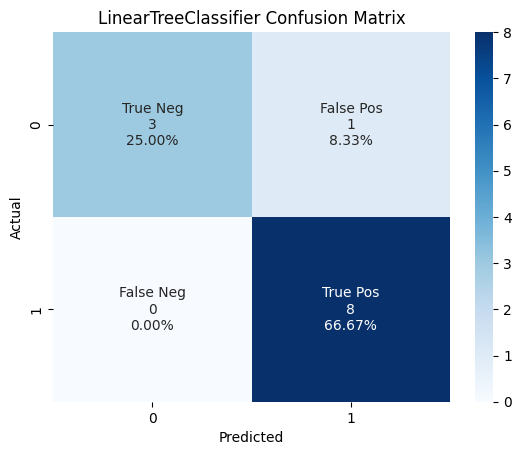

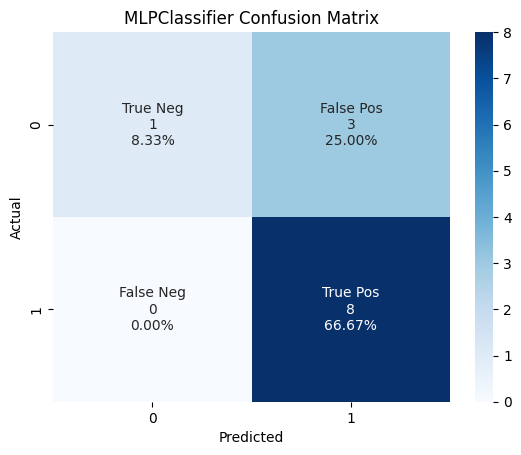

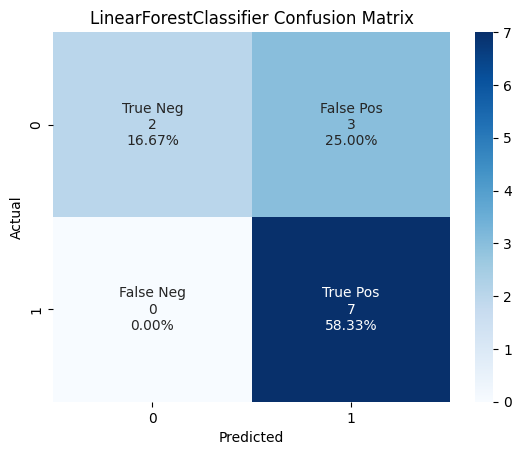

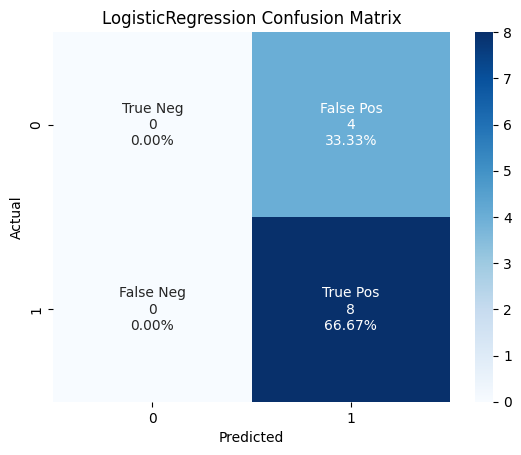

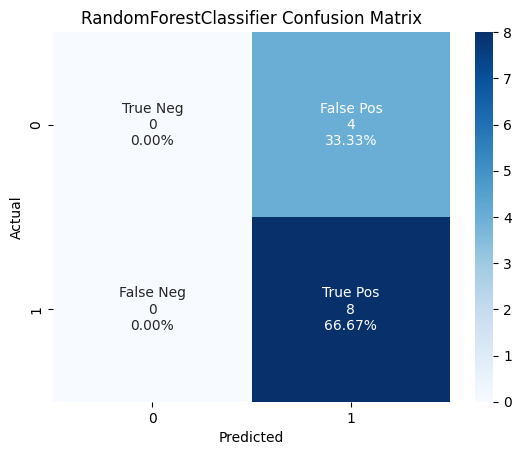

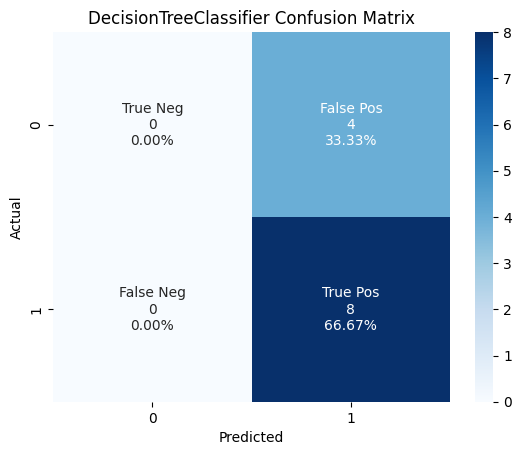

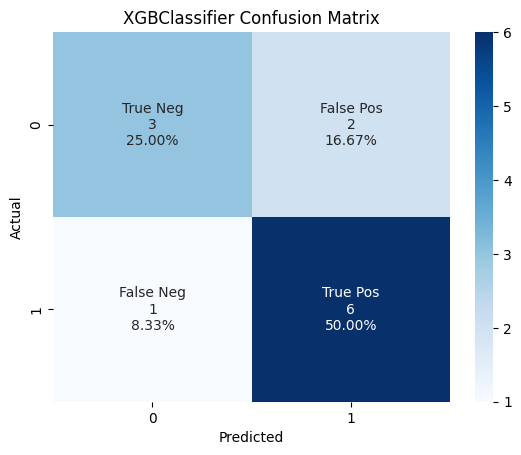

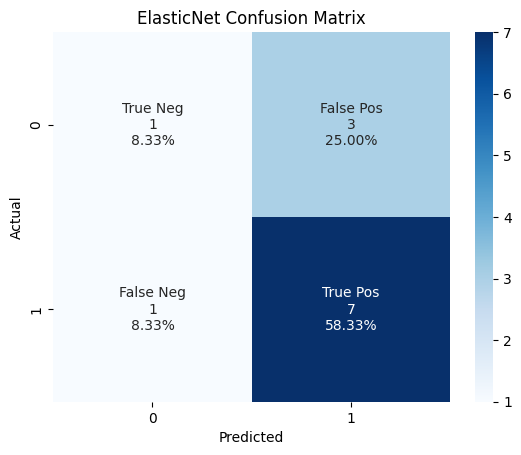

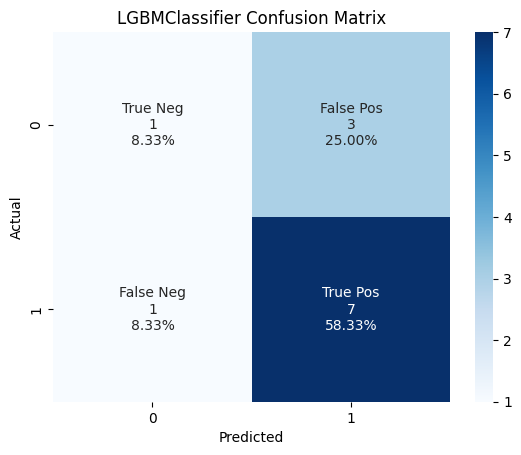

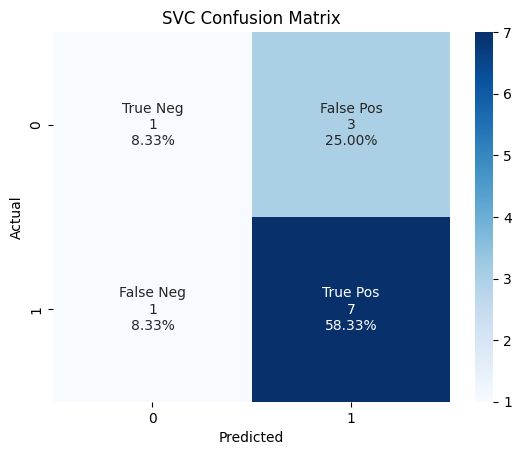

In [157]:
# get confusion matrices for single best validation results
result_dir = "../figures/single_trial_confusion_matricies"

get_confusion_matrices(model_hyperparams_best_validation.set_index("model"), result_dir=result_dir)

In [58]:
# get best model hyperparams table 

model_hyperparams = model_results[["Best Estimator", "Validation Score", "CV Train Mean"]]
model_hyperparams["Diff"] = np.abs(model_hyperparams["CV Train Mean"] - model_hyperparams["Validation Score"]) 
model_hyperparams.sort_values(by="Diff")

,Best Estimator,Validation Score,CV Train Mean,Diff
MLPClassifier,"Pipeline(steps=[('scaler', StandardScaler()),\n ('selector',\n SelectFromModel(estimator=ExtraTreesClassifier(random_state=42))),\n ('model',\n MLPClassifier(alpha=0.01, hidden_layer_sizes=(10, 10, 10),\n learning_rate_init=1, max_iter=1000,\n random_state=42))])",0.736842,0.741738,0.004896
LinearTreeClassifier,"Pipeline(steps=[('scaler', MinMaxScaler()),\n ('selector',\n <__main__.NamedFeatureSelector object at 0x7f7bf75e7a30>),\n ('model',\n LinearTreeClassifier(base_estimator=LogisticRegression(max_iter=2000,\n random_state=42,\n solver='saga')))])",0.941176,0.952177,0.011000
SVC,"Pipeline(steps=[('scaler', StandardScaler()),\n ('selector',\n SelectFromModel(estimator=ExtraTreesClassifier(random_state=42))),\n ('model', SVC(C=3, kernel='linear', random_state=42))])",0.625000,0.611920,0.013080
SVC,"Pipeline(steps=[('scaler', RobustScaler()), ('selector', None),\n ('model', SVC(C=1, kernel='sigmoid', random_state=42))])",0.705882,0.692189,0.013693
DecisionTreeClassifier,"Pipeline(steps=[('scaler', None), ('selector', None),\n ('model',\n DecisionTreeClassifier(max_depth=1, max_features='log2',\n min_samples_split=9,\n random_state=42))])",0.800000,0.784838,0.015162
DecisionTreeClassifier,"Pipeline(steps=[('scaler', StandardScaler()),\n ('selector',\n SelectFromModel(estimator=LinearSVC(dual=False, penalty='l1',\n random_state=42))),\n ('model',\n DecisionTreeClassifier(max_depth=1, max_features='log2',\n min_samples_leaf=5, random_state=42))])",0.777778,0.805069,0.027292
DecisionTreeClassifier,"Pipeline(steps=[('scaler', None), ('selector', None),\n ('model',\n DecisionTreeClassifier(max_depth=1, max_features='sqrt',\n min_samples_leaf=5, min_samples_split=9,\n random_state=42))])",0.800000,0.765714,0.034286
LogisticRegression,"Pipeline(steps=[('scaler', None), ('selector', None),\n ('model',\n LogisticRegression(C=0.001, max_iter=1000, random_state=42,\n solver='liblinear'))])",0.705882,0.669091,0.036792
RandomForestClassifier,"Pipeline(steps=[('scaler', None),\n ('selector',\n SelectFromModel(estimator=LinearSVC(dual=False, penalty='l1',\n random_state=42))),\n ('model',\n RandomForestClassifier(max_depth=1, min_samples_leaf=2,\n min_samples_split=5, n_estimators=50,\n random_state=42))])",0.800000,0.849176,0.049176
LogisticRegression,"Pipeline(steps=[('scaler', RobustScaler()), ('selector', None),\n ('model',\n LogisticRegression(C=0.001, max_iter=1000, penalty='l1',\n random_state=42, solver='saga'))])",0.736842,0.678811,0.058032


In [43]:
avg_model_results = model_results.groupby(model_results.index).mean(numeric_only=True).sort_values("Validation Score", ascending=False)
avg_model_results.columns = list(map(lambda x: "Mean " + x,avg_model_results.columns))
avg_model_results

,Mean Validation Score,Mean CV Train Mean,Mean CV Train STD,Mean CV Test Mean,Mean CV Test STD,Mean Validation STD
DecisionTreeClassifier,0.741503,0.785781,0.048249,0.528204,0.160943,0.102714
LGBMClassifier,0.741437,0.882878,0.017166,0.568762,0.137953,0.026458
ElasticNet,0.725714,0.626104,0.107489,0.595426,0.126305,0.095312
XGBClassifier,0.715873,0.974521,0.005309,0.612990,0.126206,0.102918
LogisticRegression,0.707740,0.678360,0.037793,0.596125,0.111887,0.088776
RandomForestClassifier,0.702101,0.851245,0.018961,0.651780,0.107000,0.087010
LinearForestClassifier,0.697297,0.948776,0.011972,0.605684,0.130334,0.118573
MLPClassifier,0.695642,0.727219,0.074795,0.549496,0.143482,0.117085
LinearTreeClassifier,0.687675,0.952854,0.008754,0.588671,0.127294,0.174863
SVC,0.674224,0.670321,0.021153,0.568897,0.072563,0.084740


In [35]:
avg_ensemble_results = ensemble_results.groupby(ensemble_results.index).mean(numeric_only=True).sort_values("Validation Score", ascending=False)
avg_ensemble_results.columns = list(map(lambda x: "Mean " + x,avg_ensemble_results.columns))
avg_ensemble_results

,Mean Validation Score,Mean CV Train Mean,Mean CV Train STD,Mean CV Test Mean,Mean CV Test STD,Mean Validation STD
BaggingClassifier_LGBMClassifier,0.760049,0.872044,0.018183,0.617807,0.126575,0.069395
BaggingClassifier_DecisionTreeClassifier,0.754698,0.863156,0.024290,0.602037,0.127259,0.120066
AdaBoostClassifier_LGBMClassifier,0.751671,0.961001,0.009517,0.573549,0.138084,0.096042
BaggingClassifier_RandomForestClassifier,0.732738,0.851641,0.019554,0.661293,0.100486,0.056356
AdaBoostClassifier_SVC,0.731269,0.747076,0.008725,0.698892,0.028033,0.099896
AdaBoostClassifier_LogisticRegression,0.727165,0.542525,0.046966,0.498391,0.088357,0.079072
AdaBoostClassifier_DecisionTreeClassifier,0.713895,0.973124,0.006607,0.582152,0.135806,0.091757
BaggingClassifier_SVC,0.687519,0.661115,0.101176,0.548102,0.147423,0.098066
BaggingClassifier_MLPClassifier,0.685116,0.797954,0.037487,0.612000,0.111166,0.100204
AdaBoostClassifier_RandomForestClassifier,0.681052,0.973604,0.006412,0.604260,0.126612,0.098774


In [38]:
avg_ensemble_results = avg_ensemble_results[["Mean Validation Score", "Mean Validation STD","Mean CV Train Mean", "Mean CV Test Mean"]]
avg_ensemble_results.columns = ["Val F1", "Val STD","Train F1", "Test F1"]
avg_ensemble_results.index = list(map(lambda x: x.replace("BaggingClassifier", "Bagging").replace("AdaBoostClassifier", "AdaBoost").replace("_", "-"), avg_ensemble_results.index))
avg_ensemble_results.loc["Mean"] = avg_ensemble_results.mean()
avg_ensemble_results = avg_ensemble_results.round(3)
avg_ensemble_results = avg_ensemble_results.reindex(columns=["Train F1", "Test F1", "Val F1", "Val STD"])
display(avg_ensemble_results)
print(avg_ensemble_results.style.format("{:.3f}").to_latex())

,Train F1,Test F1,Val F1,Val STD
Bagging-LGBMClassifier,0.872,0.618,0.760,0.069
Bagging-DecisionTreeClassifier,0.863,0.602,0.755,0.120
AdaBoost-LGBMClassifier,0.961,0.574,0.752,0.096
Bagging-RandomForestClassifier,0.852,0.661,0.733,0.056
AdaBoost-SVC,0.747,0.699,0.731,0.100
AdaBoost-LogisticRegression,0.543,0.498,0.727,0.079
AdaBoost-DecisionTreeClassifier,0.973,0.582,0.714,0.092
Bagging-SVC,0.661,0.548,0.688,0.098
Bagging-MLPClassifier,0.798,0.612,0.685,0.100
AdaBoost-RandomForestClassifier,0.974,0.604,0.681,0.099


\begin{tabular}{lrrrr}
 & Train F1 & Test F1 & Val F1 & Val STD \\
Bagging-LGBMClassifier & 0.872 & 0.618 & 0.760 & 0.069 \\
Bagging-DecisionTreeClassifier & 0.863 & 0.602 & 0.755 & 0.120 \\
AdaBoost-LGBMClassifier & 0.961 & 0.574 & 0.752 & 0.096 \\
Bagging-RandomForestClassifier & 0.852 & 0.661 & 0.733 & 0.056 \\
AdaBoost-SVC & 0.747 & 0.699 & 0.731 & 0.100 \\
AdaBoost-LogisticRegression & 0.543 & 0.498 & 0.727 & 0.079 \\
AdaBoost-DecisionTreeClassifier & 0.973 & 0.582 & 0.714 & 0.092 \\
Bagging-SVC & 0.661 & 0.548 & 0.688 & 0.098 \\
Bagging-MLPClassifier & 0.798 & 0.612 & 0.685 & 0.100 \\
AdaBoost-RandomForestClassifier & 0.974 & 0.604 & 0.681 & 0.099 \\
Bagging-LogisticRegression & 0.662 & 0.570 & 0.679 & 0.083 \\
Mean & 0.810 & 0.597 & 0.719 & 0.090 \\
\end{tabular}



In [42]:
avg_model_results = avg_model_results[["Mean Validation Score", "Mean Validation STD","Mean CV Train Mean", "Mean CV Test Mean"]]
avg_model_results.columns = ["Val F1", "Val STD","Train F1", "Test F1"]
avg_model_results.loc["Mean"] = avg_model_results.mean()
avg_model_results = avg_model_results.round(3)
avg_model_results = avg_model_results.reindex(columns=["Train F1", "Test F1", "Val F1", "Val STD"])
display(avg_model_results)
print(avg_model_results.style.format("{:.3f}").to_latex())

,Train F1,Test F1,Val F1,Val STD
DecisionTreeClassifier,0.786,0.528,0.742,0.103
LGBMClassifier,0.883,0.569,0.741,0.026
ElasticNet,0.626,0.595,0.726,0.095
XGBClassifier,0.975,0.613,0.716,0.103
LogisticRegression,0.678,0.596,0.708,0.089
RandomForestClassifier,0.851,0.652,0.702,0.087
LinearForestClassifier,0.949,0.606,0.697,0.119
MLPClassifier,0.727,0.549,0.696,0.117
LinearTreeClassifier,0.953,0.589,0.688,0.175
SVC,0.670,0.569,0.674,0.085


\begin{tabular}{lrrrr}
 & Train F1 & Test F1 & Val F1 & Val STD \\
DecisionTreeClassifier & 0.786 & 0.528 & 0.742 & 0.103 \\
LGBMClassifier & 0.883 & 0.569 & 0.741 & 0.026 \\
ElasticNet & 0.626 & 0.595 & 0.726 & 0.095 \\
XGBClassifier & 0.975 & 0.613 & 0.716 & 0.103 \\
LogisticRegression & 0.678 & 0.596 & 0.708 & 0.089 \\
RandomForestClassifier & 0.851 & 0.652 & 0.702 & 0.087 \\
LinearForestClassifier & 0.949 & 0.606 & 0.697 & 0.119 \\
MLPClassifier & 0.727 & 0.549 & 0.696 & 0.117 \\
LinearTreeClassifier & 0.953 & 0.589 & 0.688 & 0.175 \\
SVC & 0.670 & 0.569 & 0.674 & 0.085 \\
Mean & 0.810 & 0.587 & 0.709 & 0.100 \\
\end{tabular}



In [46]:
model_names = avg_model_results.index.tolist()
avg_model_results = avg_model_results[["Mean Validation Score", "Mean Validation STD","Mean CV Train Mean", "Mean CV Test Mean"]]
avg_model_results.columns = ["Val F1", "Val STD","Train F1", "Test F1"]
# rename the index
avg_model_results.index.name = "Model"

# sort the rows by descending order of Test F1
avg_model_results = avg_model_results.sort_values(by="Test F1", ascending=False)

# round to 3 decimal places
avg_model_results = avg_model_results.round(3)

# create the latex table
latex_table = avg_model_results.to_latex(
    float_format="{:.3f}".format, 
    index=True, 
    index_names=True, 
    header=["Train F1", "Test F1", "Val F1", "Val STD"],
    column_format="lrrrr",
    caption="Ensemble model results using bagging and AdaBoost algorithms.",
    label="tab:ensemble results"
)

# add necessary latex packages and commands
latex_table = "\\FloatBarrier\n" + latex_table
latex_table = latex_table.replace("\\begin{tabular}", "\\begin{tabular}{lrrrr}\n\\toprule\n")
latex_table = latex_table.replace("\\end{tabular}", "\n\\bottomrule\n\\end{tabular}")
latex_table = latex_table.replace("\\toprule\n  Model &", "  \\textbf{Model} &")
latex_table = latex_table.replace("\\midrule", "\\hline\n\\midrule")
latex_table = latex_table.replace("\\bottomrule\n", "\\hline\n\\bottomrule\n\\hline\n")

# display the latex table
print(latex_table)


\FloatBarrier
\begin{table}
\centering
\caption{Ensemble model results using bagging and AdaBoost algorithms.}
\label{tab:ensemble results}
\begin{tabular}{lrrrr}
\toprule
{lrrrr}
\toprule
{} & Train F1 & Test F1 & Val F1 & Val STD \\
Model                  &          &         &        &         \\
\hline
\midrule
RandomForestClassifier &    0.702 &   0.087 &  0.851 &   0.652 \\
XGBClassifier          &    0.716 &   0.103 &  0.975 &   0.613 \\
LinearForestClassifier &    0.697 &   0.119 &  0.949 &   0.606 \\
LogisticRegression     &    0.708 &   0.089 &  0.678 &   0.596 \\
ElasticNet             &    0.726 &   0.095 &  0.626 &   0.595 \\
LinearTreeClassifier   &    0.688 &   0.175 &  0.953 &   0.589 \\
SVC                    &    0.674 &   0.085 &  0.670 &   0.569 \\
LGBMClassifier         &    0.741 &   0.026 &  0.883 &   0.569 \\
MLPClassifier          &    0.696 &   0.117 &  0.727 &   0.549 \\
DecisionTreeClassifier &    0.742 &   0.103 &  0.786 &   0.528 \\
\hline
\bottomrule
\hli

In [ ]:
print(avg_model_results.style.to_latex())

In [ ]:


# create a custom style for the dataframe
def highlight_best(s):
    is_best = s == s.max()
    return ['font-weight: bold' if v else '' for v in is_best]

style = avg_model_results.style

latex_table = (r'\begin{table}[ht]' + '\n' +
               r'\begin{tabular}{lrrrr}' + '\n' +
               r'\toprule' + '\n' +
               r'Model & Mean Validation Score & Mean CV Train Mean & Mean CV Test Mean & Mean Validation Z Score' + '\n' + 
               r'\midrule' + '\n' +

               r'paste your latex table here' + '\n' +
               
               r'\end{tabular}' + '\n' +
               r'\caption{Results after implementing Bagged and Boosted version of each model and performing tuning}' + '\n' +
               r'\end{table}')

print(latex_table)

In [ ]:
pd.DataFrame(avg_ensemble_results["Mean Validation Score"]).style.to_latex()